In [1]:
"""
  Instalação de Pacotes
"""
#!pip -q install plotly --upgrade
#!pip install pyod
#!pip install seaborn
#!pip install ipywidgets
#!pip install pandas_profiling
#!pip install imblearn
#!pip install scikit-optimize
#!pip install pydantic-settings

'\n  Instalação de Pacotes\n'

In [2]:
"""
  Importação de Bibliotecas
"""
# Leitura de Dados
import warnings

# Manipulação de Dados
import pandas as pd
import numpy as np

# Plotagem de Dados
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix

# Processamento de Dados
import re
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from scipy.stats.mstats import winsorize

# Modelo Preditivo
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

In [3]:
plt.style.use('ggplot')

In [4]:
dados_treino = pd.read_csv("/kaggle/input/adult-pmr3508/train_data.csv",
        sep=r'\s*,\s*',
        engine='python',
        na_values="?")

In [5]:
dados_teste = pd.read_csv("/kaggle/input/adult-pmr3508/test_data.csv",
        sep=r'\s*,\s*',
        engine='python',
        na_values="?")

# Análise Exploratória dos Dados

## Análise sobre Raw Data

O método .describe() possibilita uma visão sobre a tendência central numérica e distribuição interquartil dos dados.

Facilmente, podemos denotar a média dos dados e o desvio padrão. Valores com médias muito discrpantes de suas medianas e/ou desvios padrões expressivamente grandes podem denotar a presença de outliers que precisam ser tratados adequadamente. Nesse viés, podemos observar que apenas "education.num" é o mais equilibrado de todos os atributos.

In [6]:
dados_treino.describe()

,Id,age,fnlwgt,education.num,capital.gain,capital.loss,hours.per.week
count,32560.000000,32560.000000,3.256000e+04,32560.000000,32560.000000,32560.000000,32560.000000
mean,32559.500000,38.581634,1.897818e+05,10.080590,1077.615172,87.306511,40.437469
std,9399.406719,13.640642,1.055498e+05,2.572709,7385.402999,402.966116,12.347618
min,16280.000000,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,24419.750000,28.000000,1.178315e+05,9.000000,0.000000,0.000000,40.000000
50%,32559.500000,37.000000,1.783630e+05,10.000000,0.000000,0.000000,40.000000
75%,40699.250000,48.000000,2.370545e+05,12.000000,0.000000,0.000000,45.000000
max,48839.000000,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


O método .info() possibilita a visão sobre os tipos dos dados e a quantidade respectiva deles. Nesse viés, temos 15 atributos válidos, distribuídos entre objetos e inteiros e que totalizam 32560 entradas.



In [7]:
dados_treino.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Id              32560 non-null  int64 
 1   age             32560 non-null  int64 
 2   workclass       30724 non-null  object
 3   fnlwgt          32560 non-null  int64 
 4   education       32560 non-null  object
 5   education.num   32560 non-null  int64 
 6   marital.status  32560 non-null  object
 7   occupation      30717 non-null  object
 8   relationship    32560 non-null  object
 9   race            32560 non-null  object
 10  sex             32560 non-null  object
 11  capital.gain    32560 non-null  int64 
 12  capital.loss    32560 non-null  int64 
 13  hours.per.week  32560 non-null  int64 
 14  native.country  31977 non-null  object
 15  income          32560 non-null  object
dtypes: int64(7), object(9)
memory usage: 4.0+ MB


O método .head() possibilita uma amostra, por padrão, dos cinco primeiros elementos do Dataset. Assim, obtemos uma familiaridade inicial com os dados.

In [8]:
dados_treino.head()

,Id,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,16280,34,Private,204991,Some-college,10,Divorced,Exec-managerial,Own-child,White,Male,0,0,44,United-States,<=50K
1,16281,58,Local-gov,310085,10th,6,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,40,United-States,<=50K
2,16282,25,Private,146117,Some-college,10,Never-married,Machine-op-inspct,Not-in-family,White,Male,0,0,42,United-States,<=50K
3,16283,24,Private,138938,Some-college,10,Divorced,Adm-clerical,Not-in-family,White,Female,0,0,40,United-States,<=50K
4,16284,57,Self-emp-inc,258883,HS-grad,9,Married-civ-spouse,Transport-moving,Husband,White,Male,5178,0,60,Hungary,>50K


## Distribuição da Variável Target

Nesta etapa, perceba que o atributo "income" é descrito por dois tipos de objetos, onde, majoritariamente, a população é classificada como "<=50K" (análise socialmente viável, mas, não tão óbvio por uma análise puramente matemática).

In [9]:
dados_treino['income'].value_counts()

income
<=50K    24719
>50K      7841
Name: count, dtype: int64

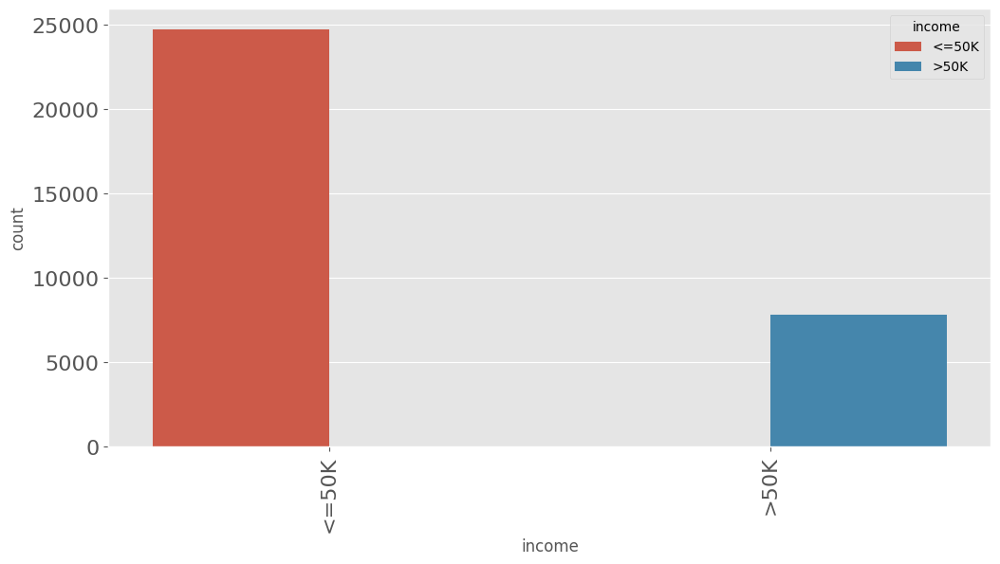

In [10]:
plt.figure(figsize=(12,6))
sns.countplot(data=dados_treino,x='income', hue=dados_treino['income'])
plt.xticks(fontsize=16,rotation = 90)
plt.yticks(fontsize=16)
plt.show()

## Representações Gráficas de Variáveis Numéricas

A partir de uma análise detalhada sobre a distribuição dos dados de cada atributo, podemos ter a seguinte visão:

### Age

A maior parte dos dados se concentra no intervalo entre 20 e 50 anos, embora, haja contribuição para idades mais avançadas. A tendência é mais uniforme para esse primeiro intervalo, haja vista sua classificação convencional de PEA (população economicamente ativa). Na versão do gráfico de densidade, percebemos a presença de uma assimetria positiva, à direita do gráfico.

Numa plotagem mais detalhada, subdividindo o atributo em dois grandes conjuntos, verificamos que, perto dos cinquenta anos, temos mais dados, ainda que entre [20, 50] houve um valor quase constante de pessoas fornecendo seus dados. Por outro lado, para idades mais avançadas, a tendência é um gráfico não crescente, com destaque especial para os idosos de 90 anos.

No ViolinPlot, notamos que a maior parte dos dados dessa categoria, tais que tem o income "<=50K" tem maior concentração nos jovens (entre 20 e 30 anos, geração Y e Z, no início de suas carreiras numa época mais atual), com mediana deslocada para entre 30 e 40 anos. Em especial, a média se concentra um pouco acima da mediana.

Por outro lado, os mais ricos tem entre 40 e 50 anos, com densidade, média e mediana centradas nessa região. São a geração X e Boomer, com mais experiêcia de vida e profissional também.

Finalmente, no Bloxplot, confirmamos a observação sobre o ViolinPlot, mas, com destaque para os outliers, numa região de 80 anos ou mais para aqueles com "income <= 50K" e de 70 anos ou mais, para "> 50K".

### Fnlwgt

É o grau de importância do indivíduo para a amostra dos dados. Muito útil para análises ponderadas. No histograma, notamos que a maioria se concentra em torno de 200000. Como os valores são do tipo float, vamos evitar a plotagem focada para economizar recursos computacionais desnecessários.

No ViolinPlot, a média, a mediana e a densidade de dados, de fato, se concentram no 200.000, tanto para "<=50K", como para ">50K". O que mostra a independência em condição à variável income.

No BoxPlot, acresecentamos a presença pesada de outliers para mais de 400.000 em ambas as divisões.

### Education Number

No histograma, podemos observar que a maioria das pessoas tem 10 a 14 anos de escolaridade. Isto significa, a níveis brasileiros, o equivalente ao médio completo.

Particionando esses intervalos de 1 a 7 anos, de 8 a 11 anos e de 12 a 16 anos, temos alguns contrastes. No primeiro intervalo, a maioria se concentra nos 7 anos de escolaridade. No segundo, a concentração está uniformemente entre 9 e 10 anos. E, por fim, no último, em 14 anos. Temos um gráfico multimodal.

ViolinPlot indica uma mediana próxima aos 9 anos, com média aos 10, para "<=50K". Por outro lado, para ">50K", a mediana é de 13, com média próxima aos 12.5. Com isso, podemos ter uma noção inicial de que, quanto maior a escolaridade, maior a chance de ter uma renda maior.

Finalmente, o BoxPlot indica alguns outliers menores e maiores que a concentração dos dados para aqueles que recebem "<=50K" e maiores para ">50K". Novamente, investigamos que, os mais ricos tem, geralmente, maior grau de escolaridade, sendo raros os casos em que a pessoa teve pouco estudo e se tornou rica.

### Capital Gain

No histograma, podemos perceber que a esmagadora maioria dos entrevistados não possui ganhos de capital. Como um outlier visível, temos alguns casos em que o ganho de capital é de 100.000, uma área distinta da concentração de dados.

No ViolinPlot, notamos que a maioria das pessoas que recebem "<=50K" não tem ganhos de capital, ao passo que os mais ricos tem algum ganho de capital (embora a mediana seja 0, a média é deslocada positivamente).

No BoxPlot, é mais claro ver outliers sobre isso. Em especial, para os mais pobres, o intervalo de ganhos é mais curto e mais concentrado para valores do que 10000. Para os mais ricos, os valores chegam a 20000, com um diferenciado que alcançou 100.000.

### Capital Loss

No histograma, podemos perceber que a esmagadora maioria dos entrevistados não possui perdas de capital. Como um outlier visível, temos alguns casos em que a perda de capital é de 4.000, uma área distinta da concentração de dados.

No ViolinPlot, notamos que a maioria das pessoas que recebem "<=50K" não tem perdas de capitais, embora, ainda haja uma amostra mais relevante do que os ganhos. Isso significa que aqueles que tentam algum investimento, geralmente, o perdem. Por outro lado, os mais ricos tem mais perdas de capitais.

No BoxPlot, é mais claro ver outliers sobre isso. Em especial, para os mais pobres, o intervalo de perdas é mais longo e mais concentrado para valores próximos a 2000, com um maior que passa os 4000. Para os mais ricos, as perdas são mais concentradas a valores em torno de 2500.

### Horas Por Semana

No histograma, a maioria das pessoas trabalha 40 horas semanais, com outliers próximos a 100 horas. Subdividindo esses dados em intervalos de [1, 30], [31, 60], [60, 99], notamos que, no primeiro intervalo, a concentração se dá em torno de 20 e de 25 horas, com os demais horários com uma frequẽncia menor do que 500.
No segundo, 40, com os demais valores com frequência menor do que 5000. E, finalmente, para o último, 60. Os demais se encontram com frequência menor do que 500 também.

No ViolinPlot, notamos que os que ganham "<=50K" normalmente, trabalham 40 horas semanais, mas, com ampla distribuição para mais e para menos. Por outro lado, os mais ricos trabalham mais, com mediana de 40 horas e média de cerca de 45. A tendência é de que, quanto mais tempo de trabalho, mais rico é.

O BoxPlot indica outliers para mais e para menos para ambos os casos, embora a concentração de "<=50K" seja mais densa e mais baixa do que os mais ricos.

In [11]:
def DistHistAmpla(df, atributo):
  # Organização do Título
  titulo = ' '.join(atributo.split('_'))
  titulo = '"' + titulo + '"'

  # Plotagem dos dados em Histogramas
  # Visão ampla
  plt.figure(figsize=(4, 2))
  plt.hist(df[atributo], color='indianred', edgecolor='firebrick', linewidth=1.5, linestyle='--')
  plt.xlabel(titulo, fontsize=10)
  plt.ylabel('Frequência', fontsize=10)
  plt.title(f'Histograma de {titulo}', fontsize=17)
  plt.show()

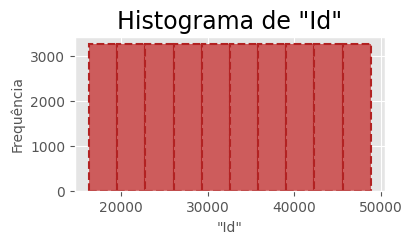

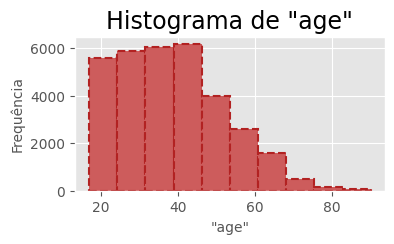

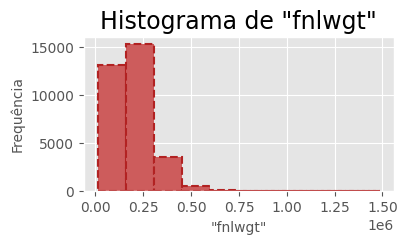

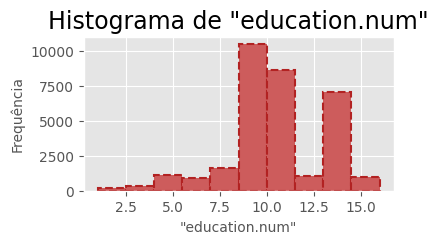

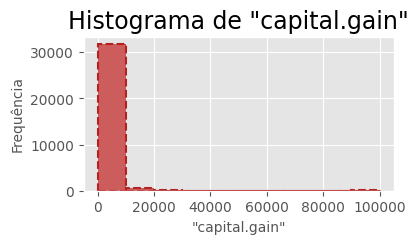

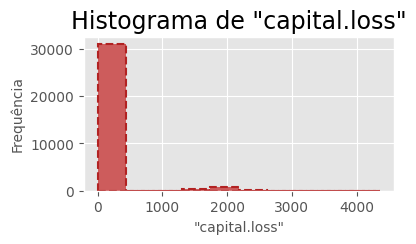

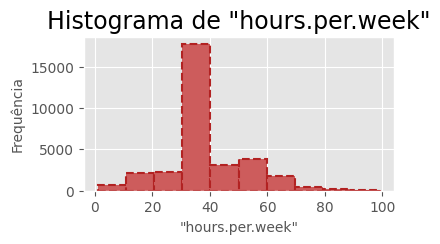

In [12]:
for coluna in dados_treino.columns:
  if pd.api.types.is_numeric_dtype(dados_treino[coluna]):
    DistHistAmpla(dados_treino, coluna)
    print()

In [13]:
def DistributionDensity(df, atributo):
  sns.set_style("darkgrid")
  sns.set(font_scale = 1.0)

  sns.displot(
      df[atributo],
      color="indianred",
      height=4,
      aspect=2,
      kind='kde'
  )

  plt.ylabel('Densidade da distribuição')
  plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


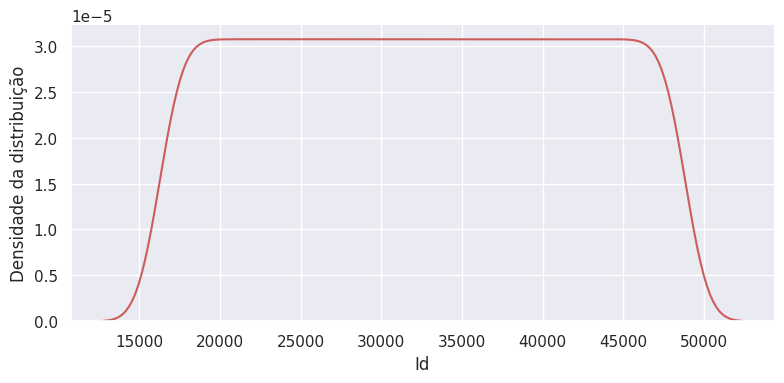

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


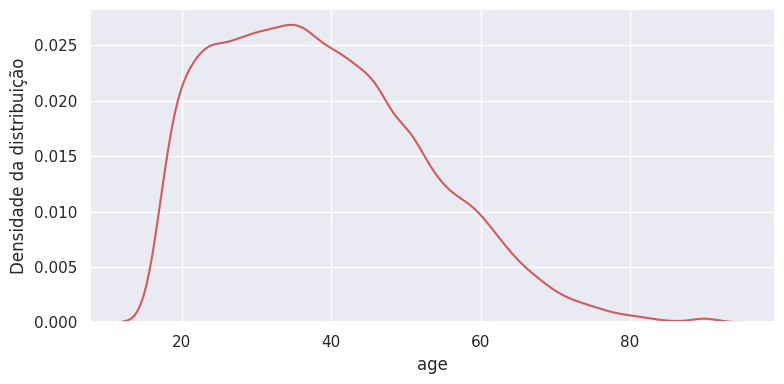

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


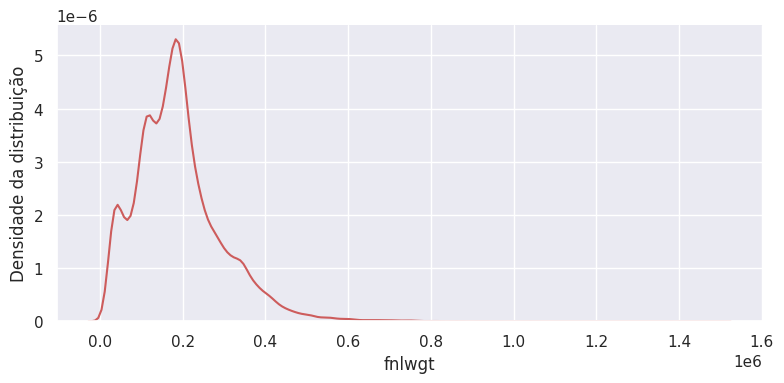

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


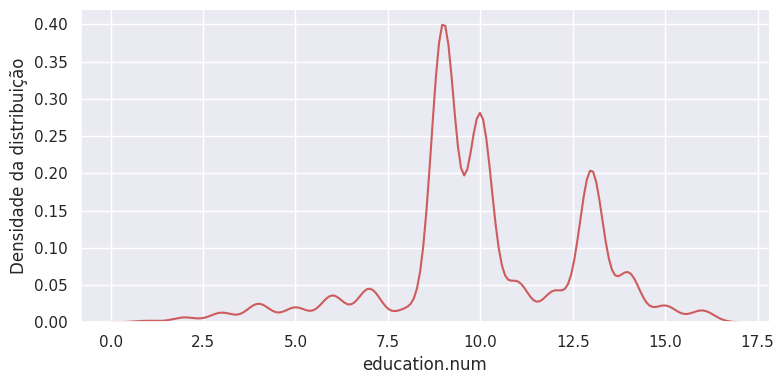

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


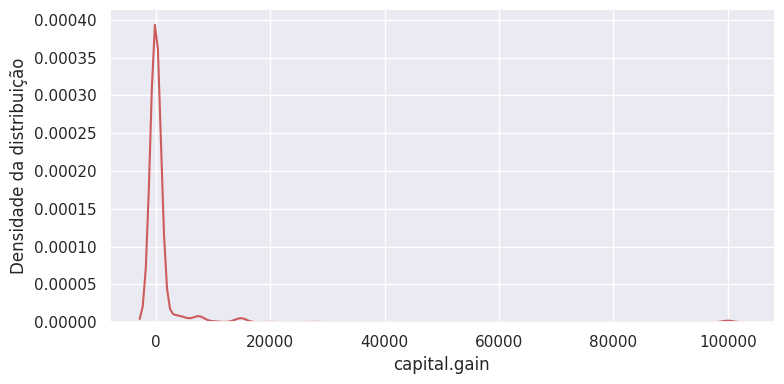

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


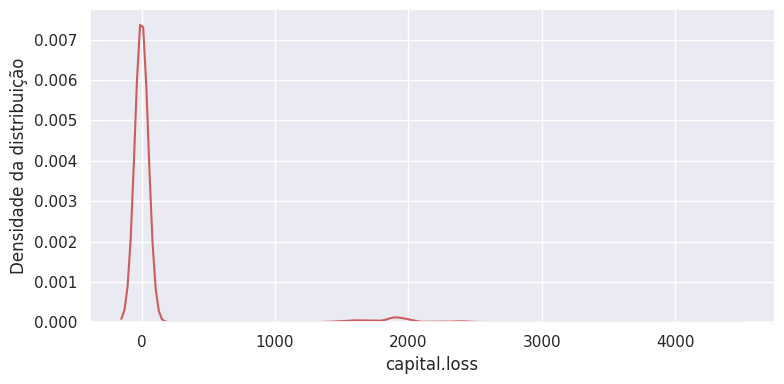

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


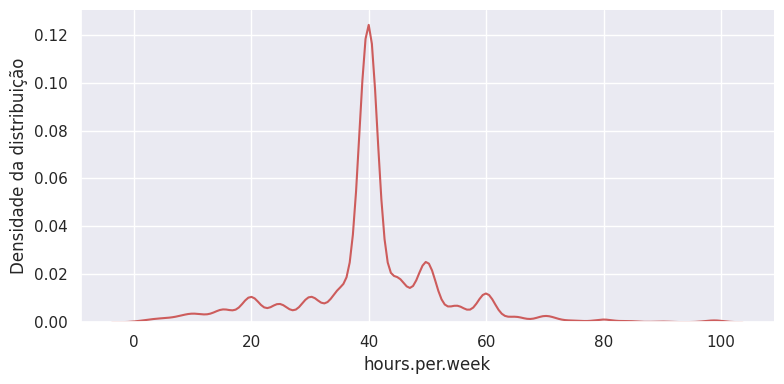

In [14]:
for coluna in dados_treino.columns:
  if pd.api.types.is_numeric_dtype(dados_treino[coluna]):
    DistributionDensity(dados_treino, coluna)

In [15]:
def DistHistFoccus(df, atributo, start, end):
  # Organização do Título
  titulo = ' '.join(atributo.split('_'))
  titulo = '"' + titulo + '"'

  # Plotagem dos dados em Histogramas
  # Visão centrada nos dados
  plt.figure(figsize=(4, 2))
  plt.hist(df[atributo], bins=range(start, end), color='indianred', edgecolor='firebrick', linewidth=1.5, linestyle='--')
  plt.xlabel(titulo, fontsize=10)
  plt.ylabel('Frequência', fontsize=10)
  plt.title(f'Histograma de {titulo}', fontsize=17)
  plt.tick_params(axis='both', labelsize=10)
  plt.show()
  print()

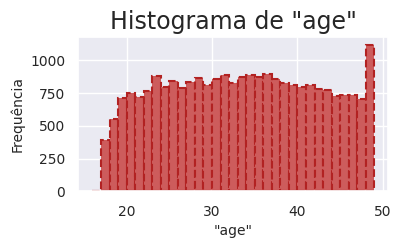

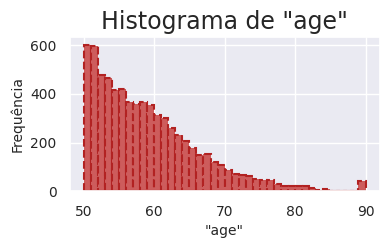

In [16]:
DistHistFoccus(dados_treino, 'age', dados_treino['age'].min() - 1, 50)
DistHistFoccus(dados_treino, 'age', 50, dados_treino['age'].max() + 1)

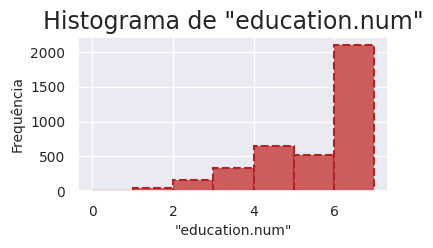

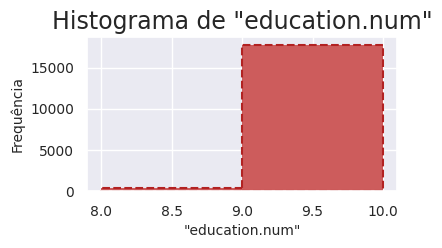

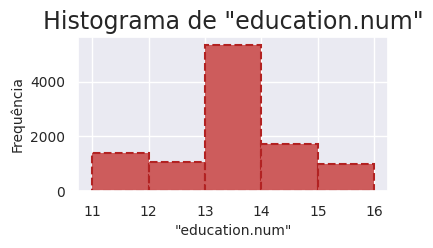

In [17]:
DistHistFoccus(dados_treino, 'education.num', dados_treino['education.num'].min() - 1, 8)
DistHistFoccus(dados_treino, 'education.num', 8, 11)
DistHistFoccus(dados_treino, 'education.num', 11, dados_treino['education.num'].max() + 1)

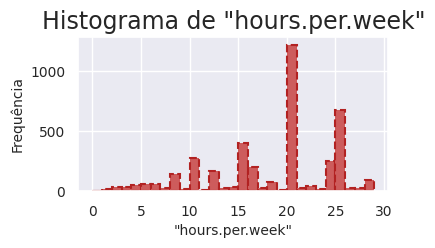

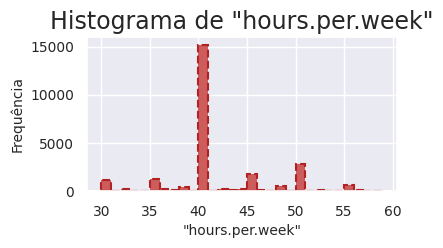

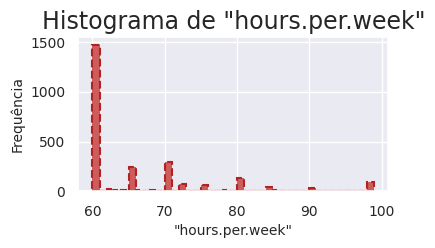

In [18]:
DistHistFoccus(dados_treino, 'hours.per.week', dados_treino['hours.per.week'].min() - 1, 30)
DistHistFoccus(dados_treino, 'hours.per.week', 30, 60)
DistHistFoccus(dados_treino, 'hours.per.week', 60, dados_treino['hours.per.week'].max() + 1)

In [19]:
def DistHistLog(df, atributo):
  # Organização do Título
  titulo = ' '.join(atributo.split('_'))
  titulo = '"' + titulo + '"'

  TableLog = np.log(df[atributo])
  # Plotagem dos dados em Histogramas
  # Visão centrada nos dados
  plt.figure(figsize=(4, 2))
  plt.hist(TableLog, bins=range(35), color='indianred', edgecolor='firebrick', linewidth=1.5, linestyle='--')
  plt.xlabel(titulo, fontsize=10)
  plt.ylabel('Frequência', fontsize=10)
  plt.title(f'Histograma de {titulo}', fontsize=17)
  plt.show()
  print()

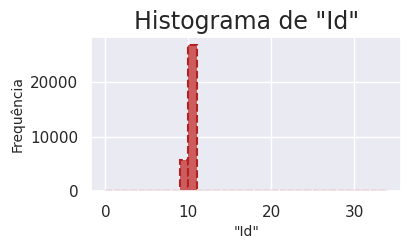

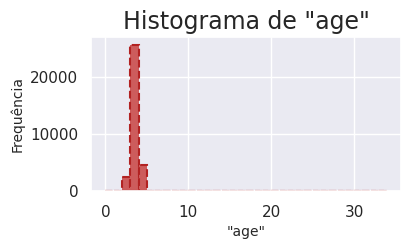

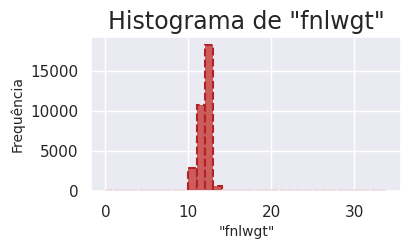

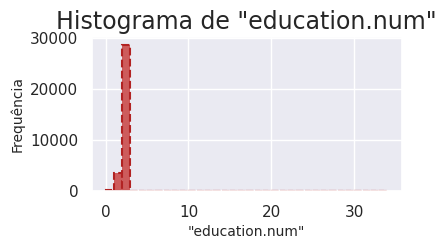

/opt/conda/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


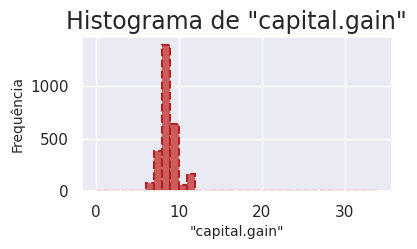

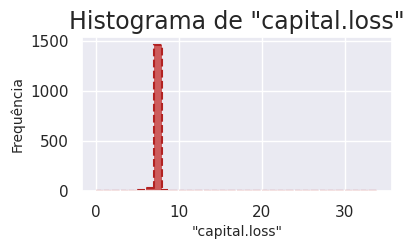

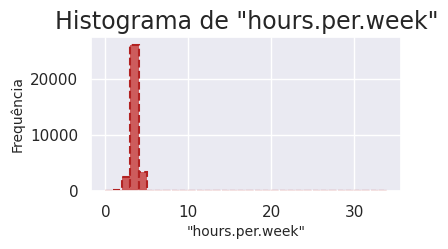

In [20]:
for coluna in dados_treino.columns:
  if pd.api.types.is_numeric_dtype(dados_treino[coluna]):
    DistHistLog(dados_treino, coluna)

In [21]:
def DistributionDensityLog(df, atributo):
  sns.set_style("darkgrid")
  sns.set(font_scale = 1.0)

  TableLog = np.log(df[atributo])

  sns.displot(
      TableLog,
      color="indianred",
      height=4,
      aspect=2,
      kind='kde'
  )

  plt.ylabel('Densidade da distribuição')
  plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


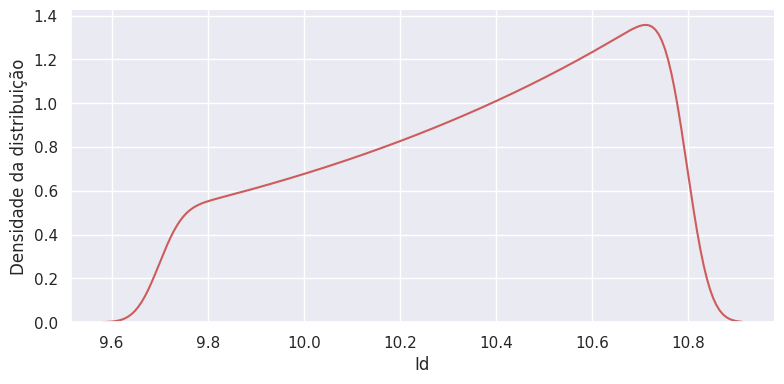

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


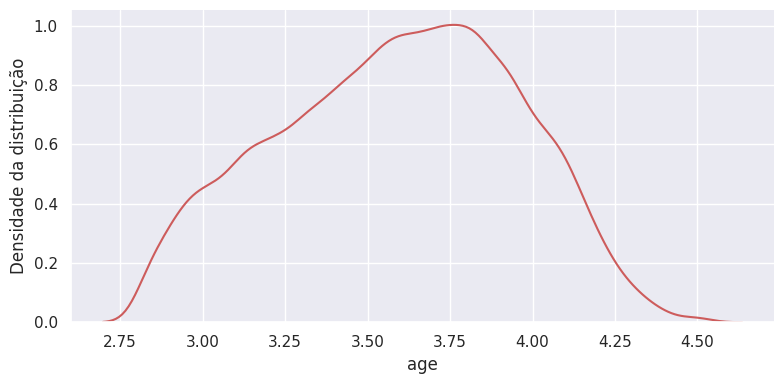

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


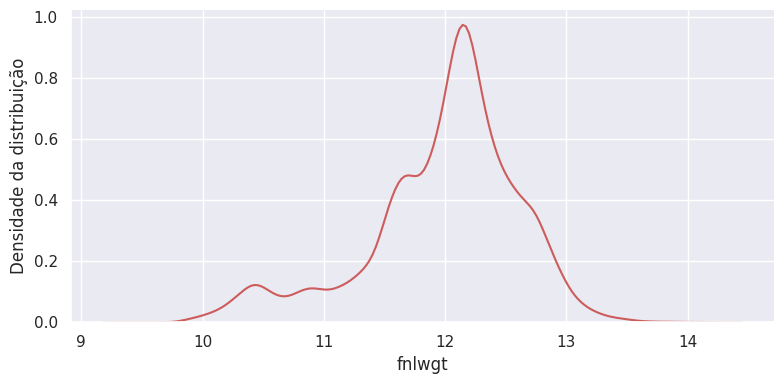

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


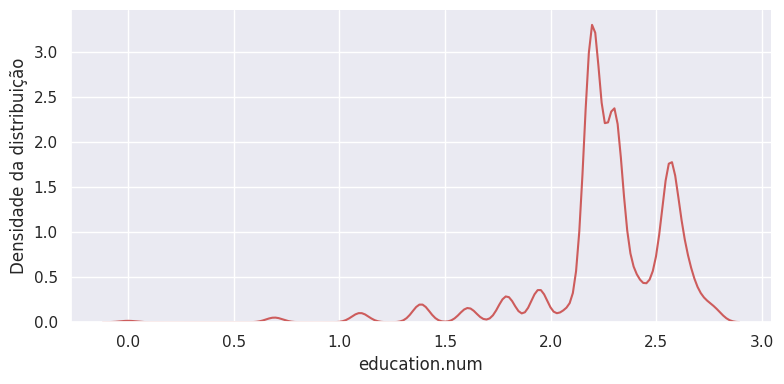

/opt/conda/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


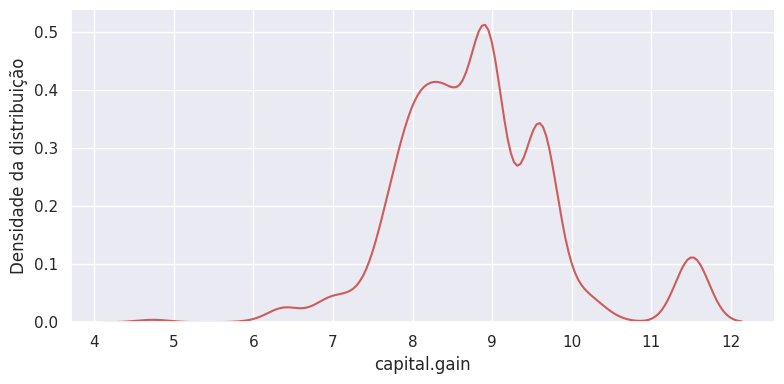

/opt/conda/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


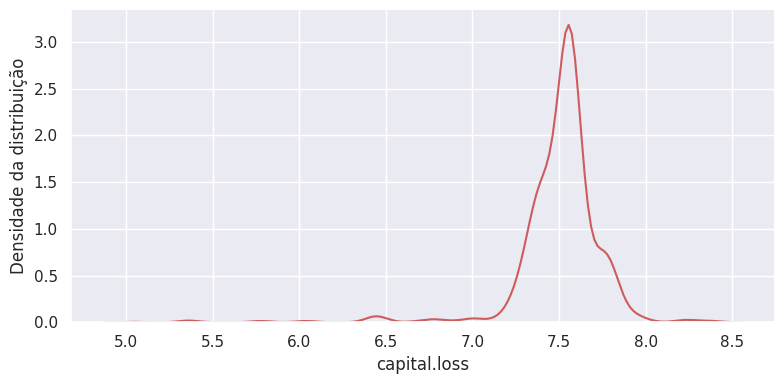

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


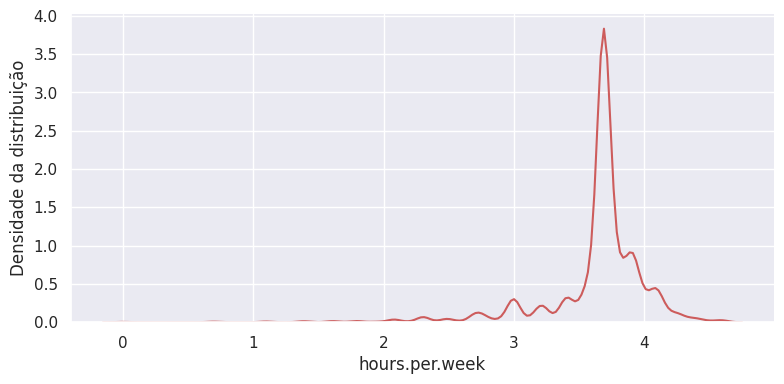

In [22]:
for coluna in dados_treino.columns:
  if pd.api.types.is_numeric_dtype(dados_treino[coluna]):
    DistributionDensityLog(dados_treino, coluna)

In [23]:
def ViolinPlot(df, atributo):
  plt.figure(dpi=100)
  sns.violinplot(x="income",
                 y=atributo,
                 data=df);

  # Calcular e plotar a média
  mean_values = dados_treino.groupby("income")[atributo].mean()
  for i, mean in enumerate(mean_values):
      plt.scatter(i, mean, color='red', label='Média' if i == 0 else "", marker='o')

  plt.show()

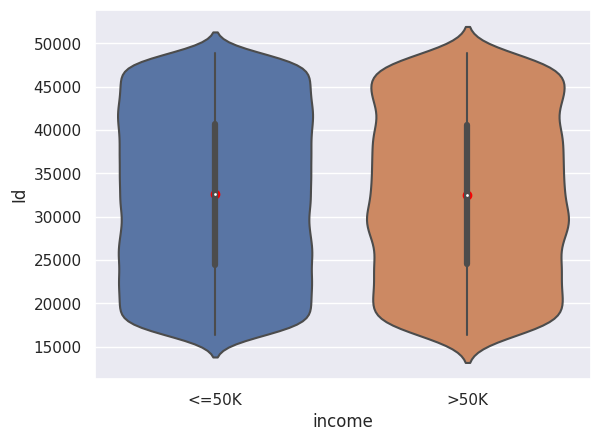

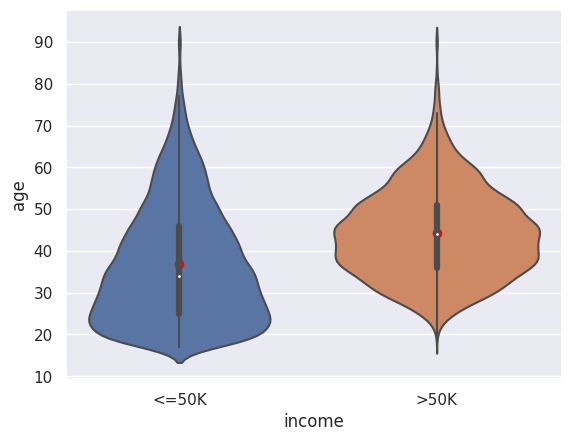

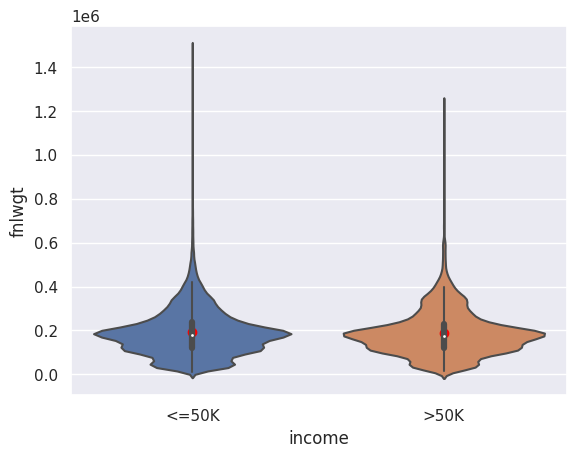

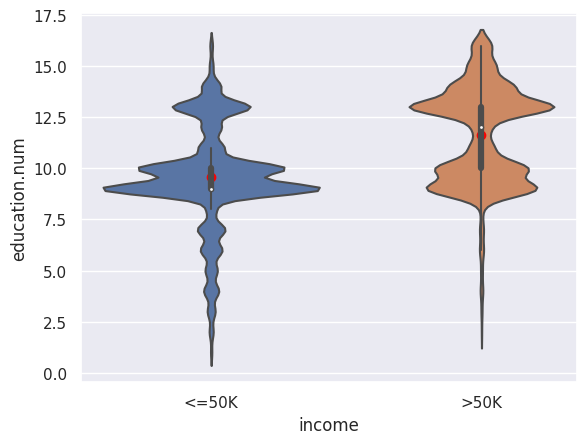

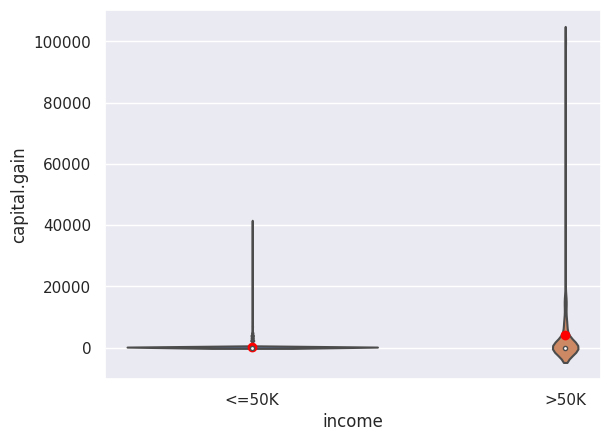

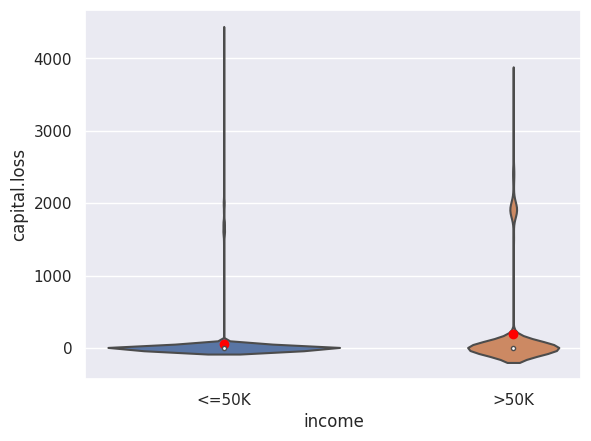

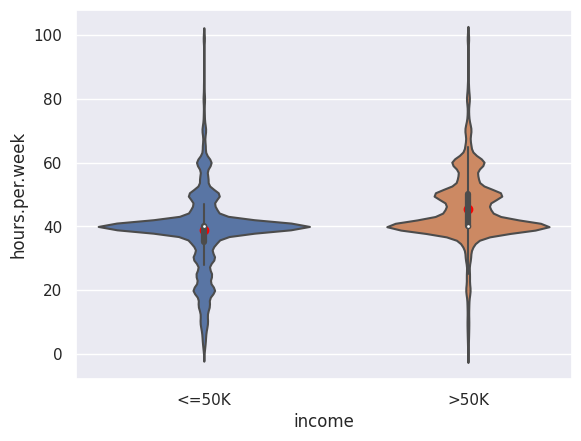

In [24]:
for coluna in dados_treino.columns:
  if pd.api.types.is_numeric_dtype(dados_treino[coluna]):
    ViolinPlot(dados_treino, coluna)

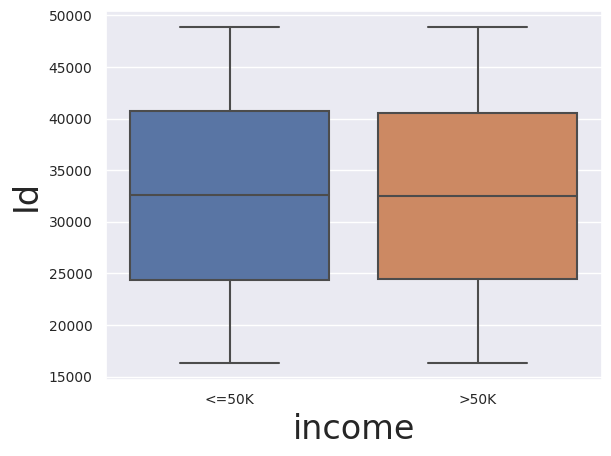

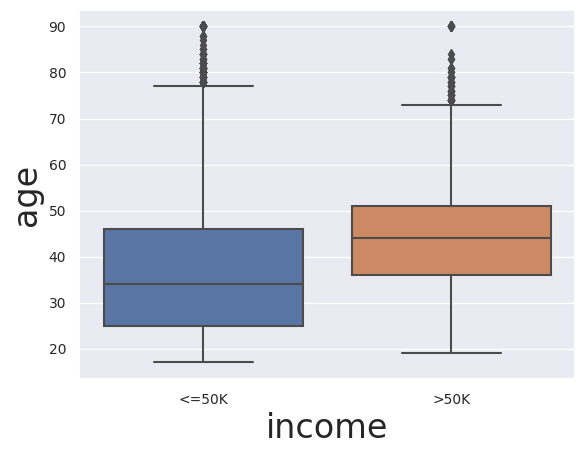

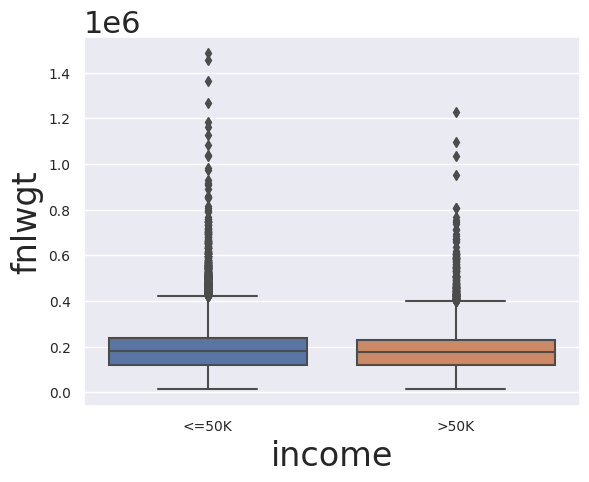

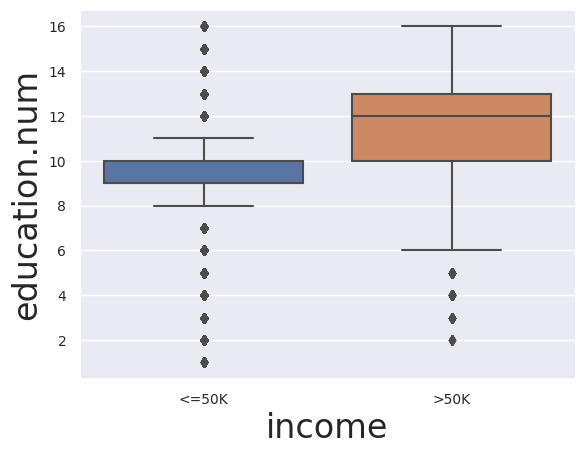

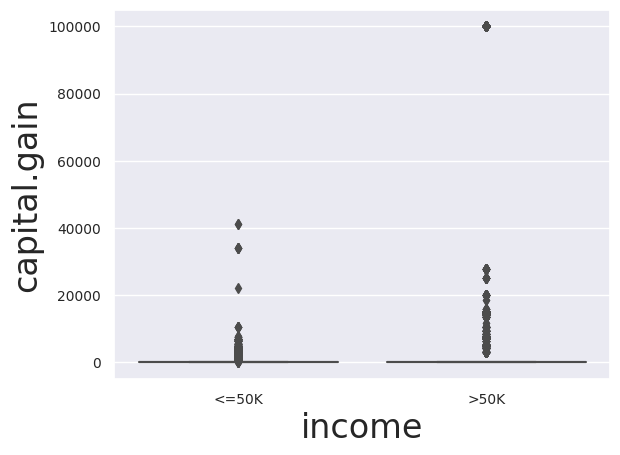

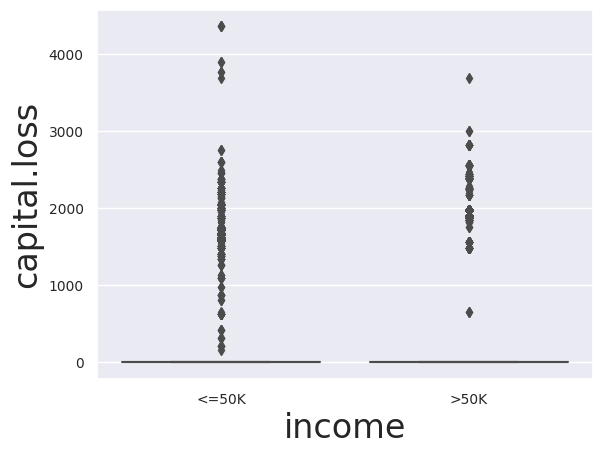

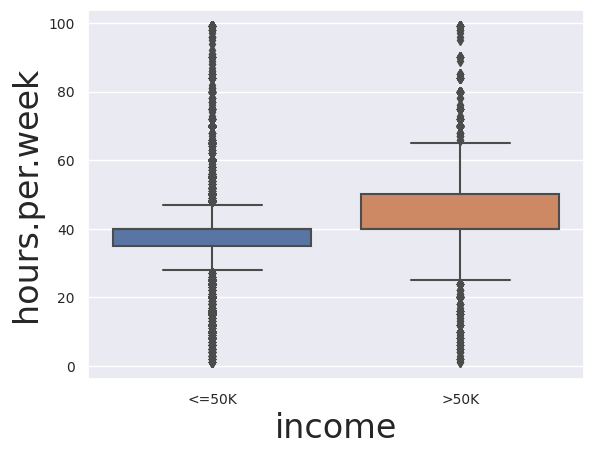

In [25]:
for coluna in dados_treino.columns:
  if pd.api.types.is_numeric_dtype(dados_treino[coluna]):
    sns.set(font_scale = 2)
    plt.figure(dpi=100)
    sns.boxplot(x="income", y=coluna, data=dados_treino)
    plt.tick_params(axis='both', labelsize=10)
    plt.show()

## Representações Gráficas das Variáveis Não Numéricas

A partir de uma análise detalhada sobre os dados, podemos observar a conseguinte sobre os dados:

### Workclass

A esmagadora maioria dos trabalhadores trabalha em empresas privadas (o que justifica o modelo de jornada trabalhista de 40 horas). Prosseguido de trabalhadores "self-emp-inc" de funcionários de prefeituras.

Também é notório perceber a quantidade de "NaN"s, representados pela interrogação. Estes são indicativos de Missing Values que devem ser tratados posteriormente, pois atrapalham o processamento dos dados. Felizmente, eles não são TÃO significativos a ponto de forçar a exclusão dessa coluna de dados.

Separando em categorias pela target "income", notamos que, tal como a maioria que ganha menos do que 50.000, a maioria que recebe mais do 50K também trabalha em empresas privadas. Tanto a termos absolutos, quanto percentuais.

Por outro lado, muitas pessoas que não responderam ganham menos do que 50K, o que pode atrapalhar um pouco a análise. Em seguida, temos os "self-emp-not-inc" e, então, "local-gov".

Também há categorias não representativas, como os que nunca trabalharam e os desempregados que precisam de tratamento.

### Education

Agora, na versão categórica, confirmamos que a maioria da população concluiu apenas o Ensino Médio. Seguindo daqueles que fizeram alguma gradução e os que tem bacharelado. Os anos fundamentais estão espalhados por todo o gráfico. E a pré-escola é a menos significativa de todas. Nesse viés, precisa ser tratada para não ser considerada um outlier.

Quando separamos em categorias, a maior parte daqueles que recebem menos do que 50K concluíram apenas o Ensino Médio, seguido daqueles que fizeram alguma faculdade e, depois, daqueles que possuem um bacharelado. A termos percentuais esse valor fica ainda mais discrepante.

Aos que recebem mais são, sobretudo, os que possuem bacharelado, seguido de Ensino Médio Completo. Aos que fizeram Mestrado, a diferença também é gritante.

Isso confirma que, quanto maior a escolaridade, maior a tendência de renda.

### Marital Status

No histograma, verificamos que a maioria das pessoas é casada, seguida dos solteiros e dos divorciados. Uma classe rara são os casados com militares, que podem acabar se tornando outliers.

Quando separamos em categorias pelo "income", verificamos que a maioria que recebe menos que 50K são solteiros, seguidos dos casados e dos divorciados. Por outro lado, a esmagadora maioria dos mais ricos são casados, tanto em termos absolutos, quanto percentuais.

### Ocupation

No histograma, a maioria dos entrevistados trabalha com "Prof-specialty", "Craft-repair", "Exec-managerial", "Adm-clerical" e "Sales", com contraste aos que trabalham nas forças armadas (por isso, há poucos casados com aqueles que possuem esta ocupação).

Além disso, temos pelo menos 1500 casos de Missing Values, representados pela interrogação.

Quando separamos em categorias pelo "income", verificamos que a maioria que recebe menos que 50K são "Adm-clerical", "Craft-repair", "Sales" ou fazem outro serviços.

Por outro lado, os mais ricos são "Exec-Managerial" e "Prof-specialty". E isso é mais gritante quando aplicamos a termos percentuais.

Os NaNs tem parcela significativa na distribuição dos que recebem menos que 50K.

### Relationship

Maioria dos entrevistados se apresentam como Maridos, seguidos daqueles que não estão numa família.

Quando separamos em categorias pelo "income", verificamos que a maioria não estão em uma família, seguido por aqueles que são maridos. Mas, entre os mais ricos, em geral, são os maridos. Aqui devemos dar uma atenção especial aos filhos e a outros parentes entre os que recebem ">50K".

### Race

Pelo histograma, a maioria se consagra como brancos, seguidos pelos negros. Damos uma atenção especial aos esquimós/ameríndios, que são pouco representativos e poderiam ser unidos a "outros", para evitar tratamento como outlier.

Quando separamos em categorias pelo "income", verificamos que a maioria dos que recebem "<=50K" são brancos, embora o mesmo cenário se repita com os mais ricos. Inclusive, a termos percentuais, os brancos recebem mais do que 50K do que os que recebem menos. Isso se repete aos leste-asiáticos.

### Sex

Pelo histograma, verificamos que a maioria dos entrevistados são homens.

Quando separamos em categorias pelo "income", verificamos que a maioria dos que recebem "<=50K" são homens, tal como entre os mais ricos.

Percentualmente, ainda assim, homens recebem mais do que as mulheres em ambos os quesitos. E, além disso, há mais mulheres que recebem menos do que 50K do que o contrário.

### Native Country

A esmagadora maioria dos entrevistados são estadunidenses, seguido dos mexicanos e os NaN (parcela significativa que precisa ser tratada entre os Missing Values). Por outro lado, o resto da população mundial é expressivamente insignificativa e é estratégico uní-los em grupos de semelhança.

Quando separamos em categorias pelo "income", verificamos que a maioria que a maioria dos que recebem "<=50K" são dos EUA, tal como entre os mais ricos. Em seguida ao México.

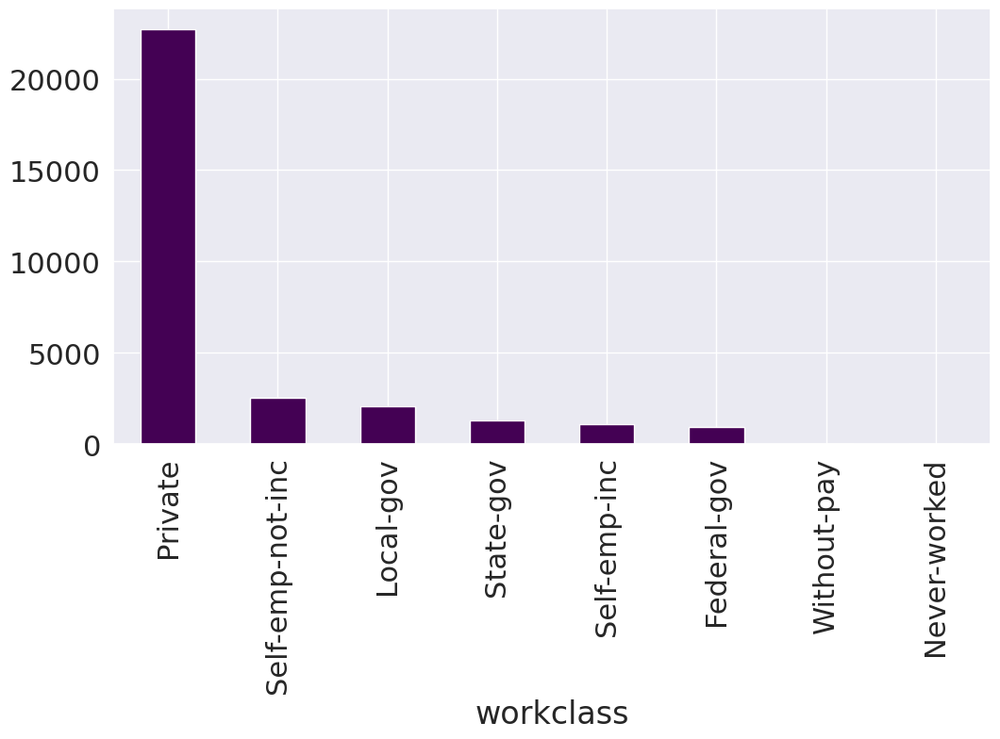

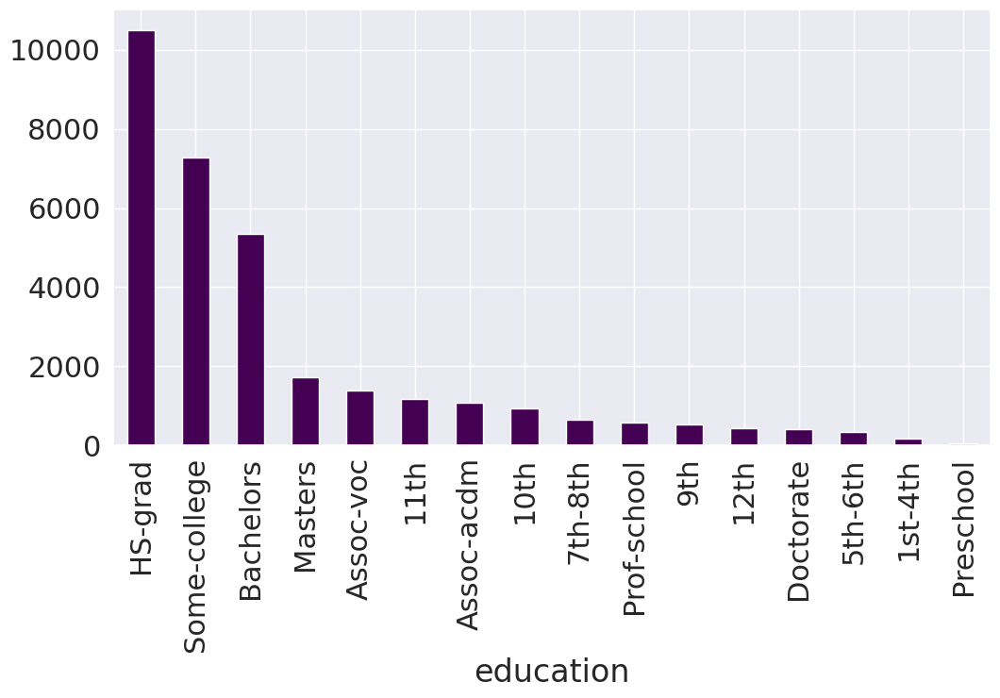

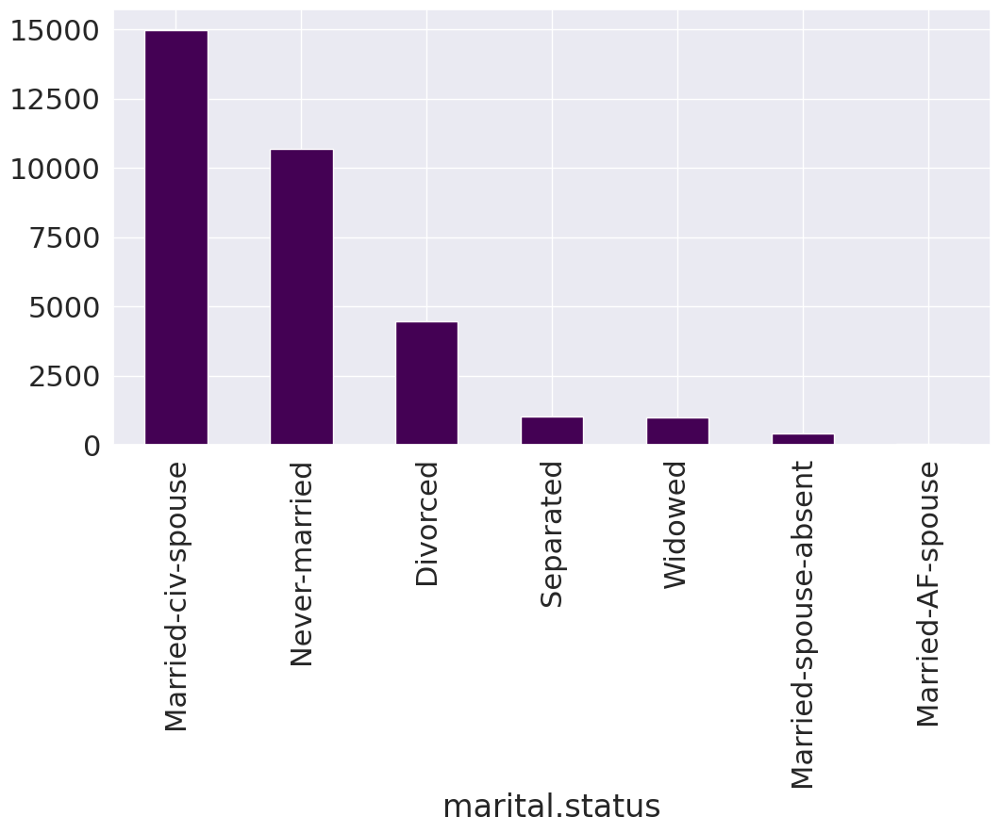

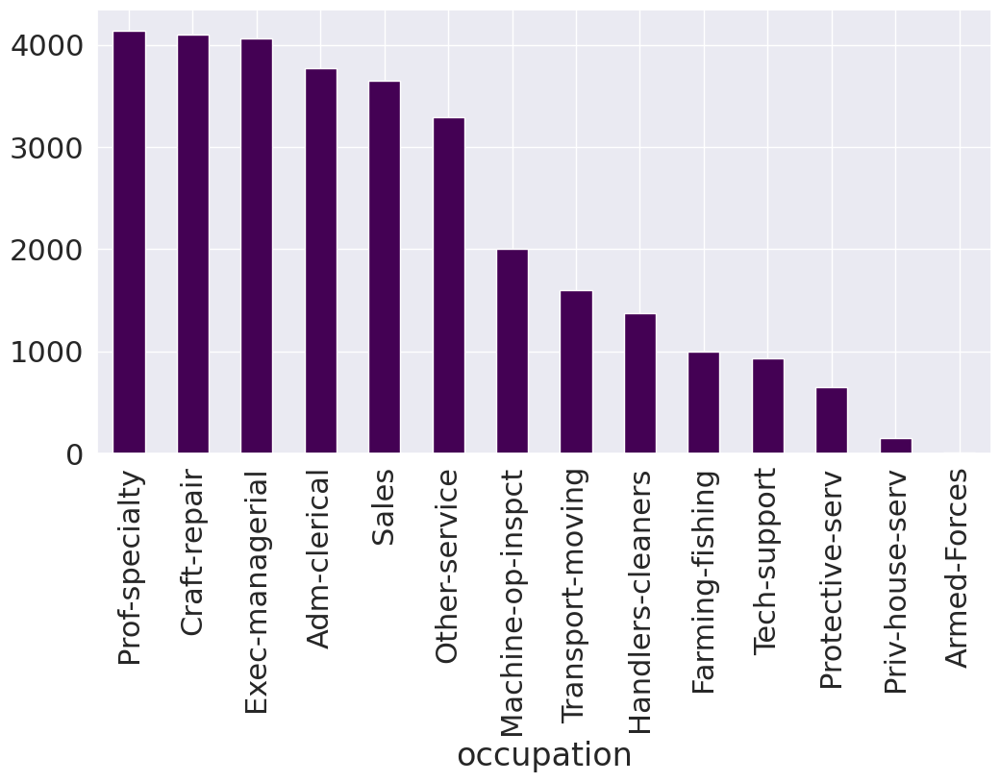

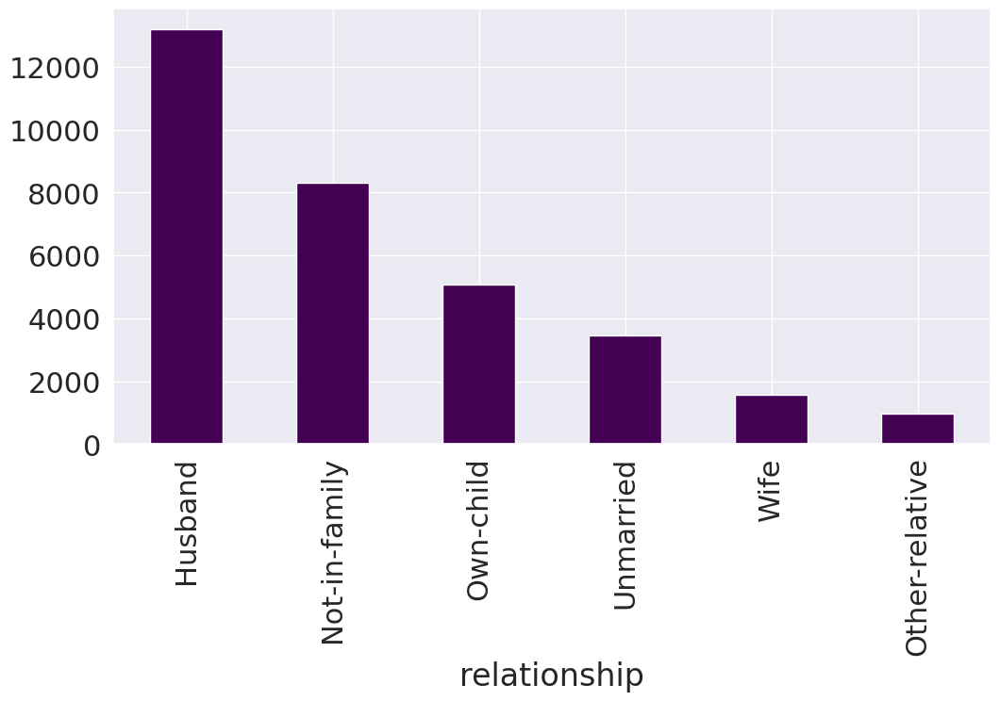

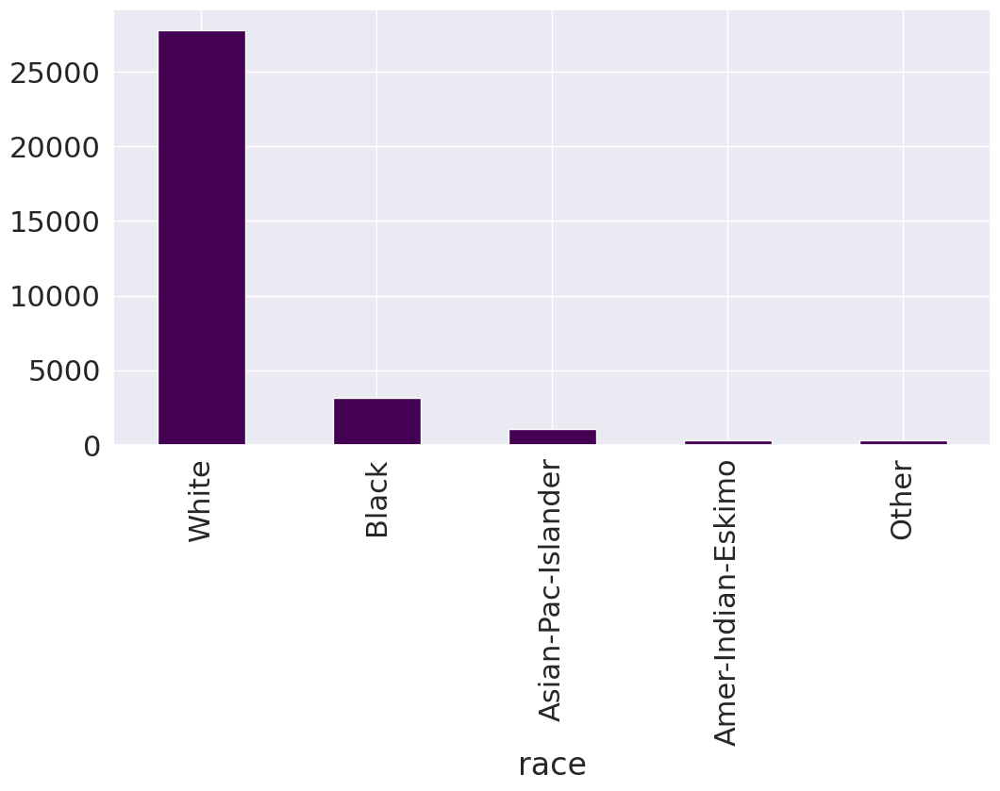

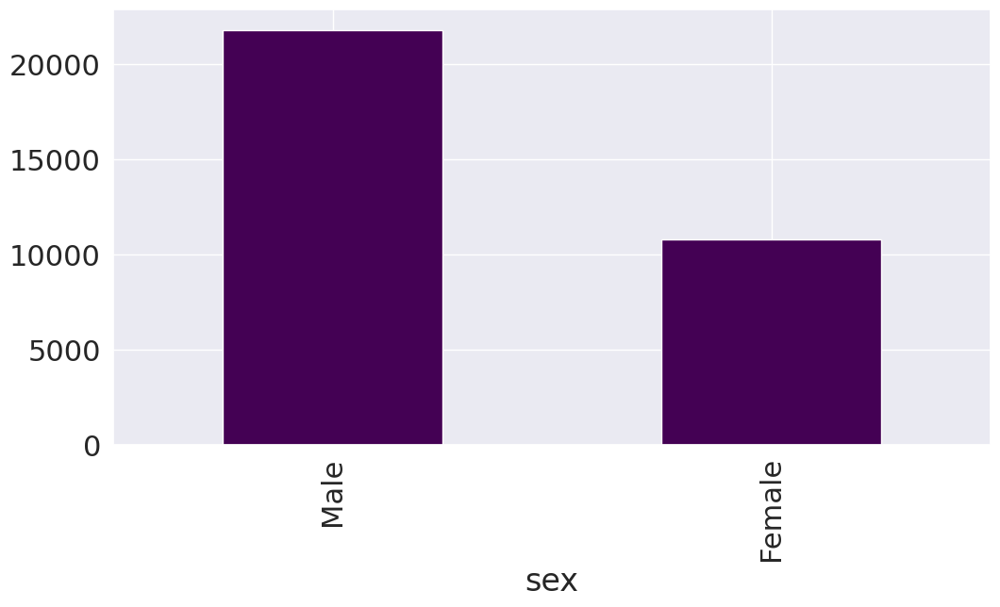

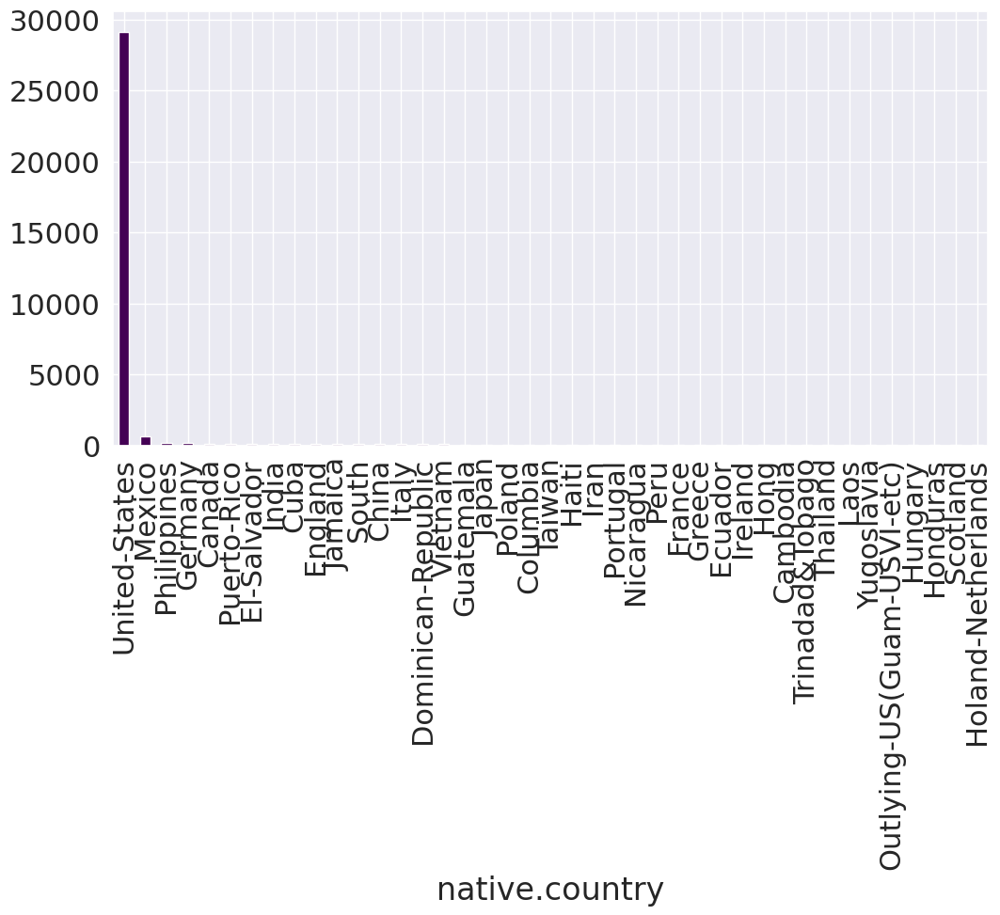

In [26]:
for coluna in dados_treino.columns:
  if pd.api.types.is_object_dtype(dados_treino[coluna]) and coluna != 'income':
    dados_treino[coluna].value_counts().plot(kind="bar", figsize=(12,6), colormap='viridis')
    plt.show()
    print()

In [27]:
sns.set(font_scale=6)
fig, axes = plt.subplots(3, 3, figsize=(80,70), sharey=False)
fig.tight_layout(h_pad = 8, w_pad = 2 )

i = 0
for coluna in dados_treino:
    if pd.api.types.is_object_dtype(dados_treino[coluna]):
      ax = sns.countplot(x = coluna, hue= 'income', data=dados_treino, ax = axes[i//3, i%3])
      ax.tick_params(axis='x', labelrotation=90)
      i += 1

plt.show()

In [28]:
def HistPlot(df, atributo):
  plt.figure(figsize=(12, 6))
  sns.histplot(data=df, x=atributo, hue='income', multiple='dodge',
                stat='percent', shrink=0.5, common_norm=False, legend=False)
  plt.xticks(fontsize=5, rotation=90)
  plt.yticks(fontsize=5)
  plt.xlabel(atributo, fontsize=10)
  plt.ylabel('Porcentagem (%)', fontsize=10)
  plt.title(f'Histograma de {atributo} por Renda', fontsize=12)
  plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

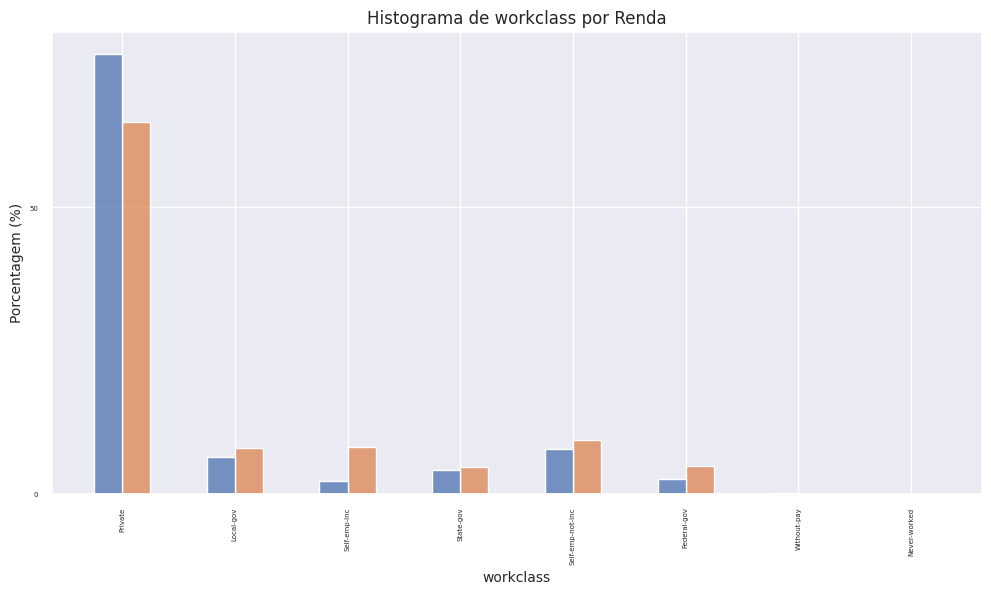

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

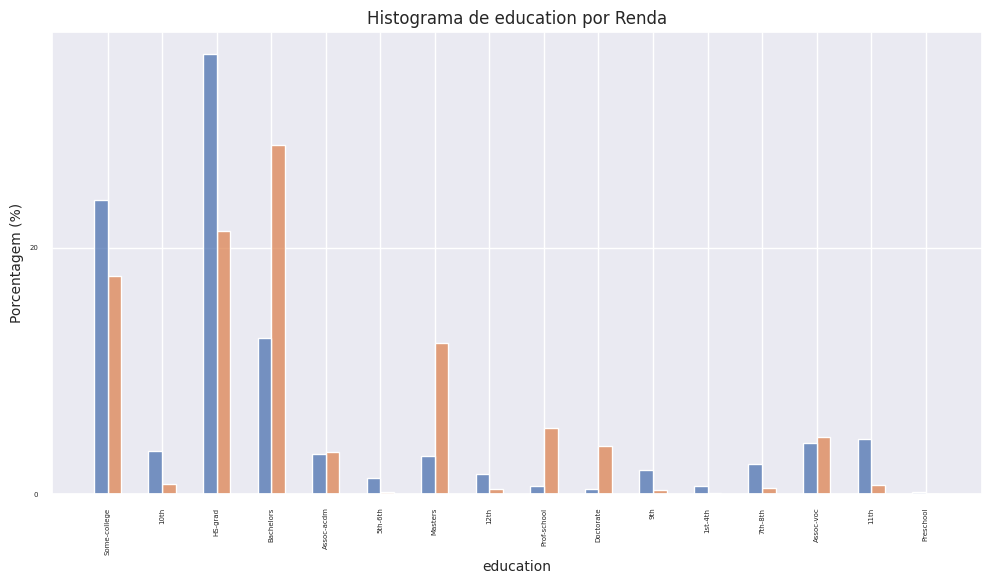

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

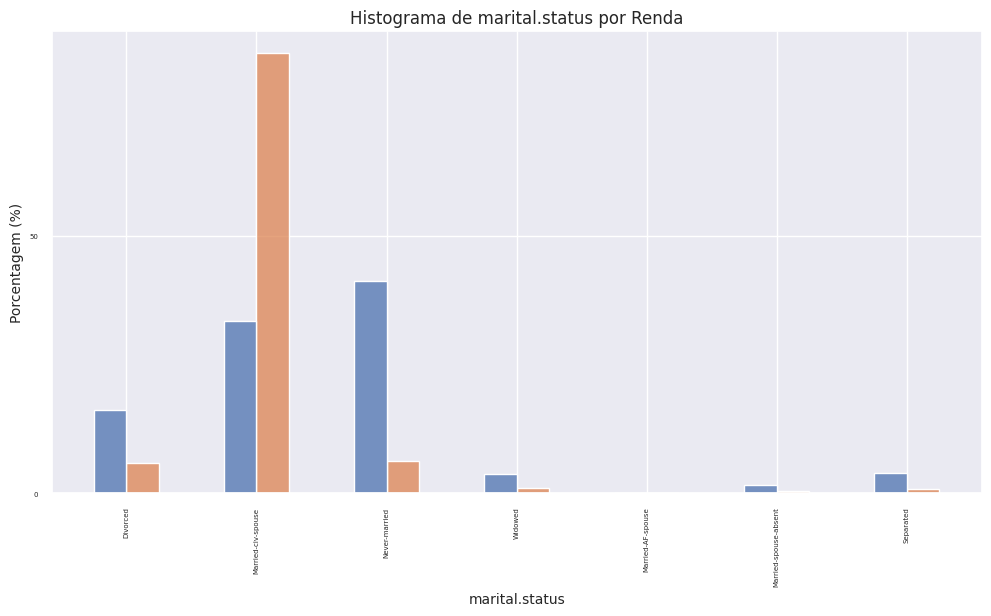

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

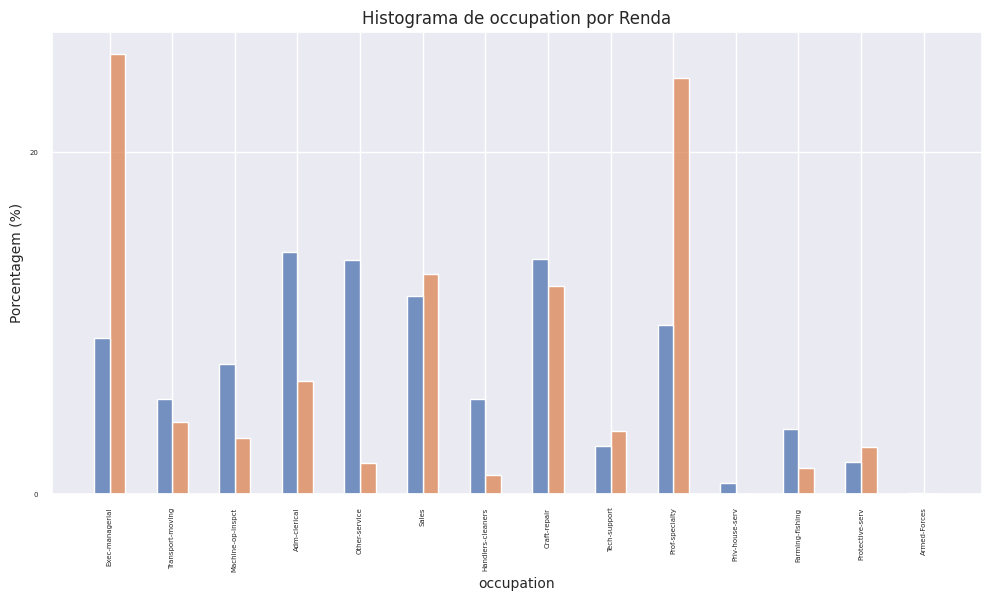

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

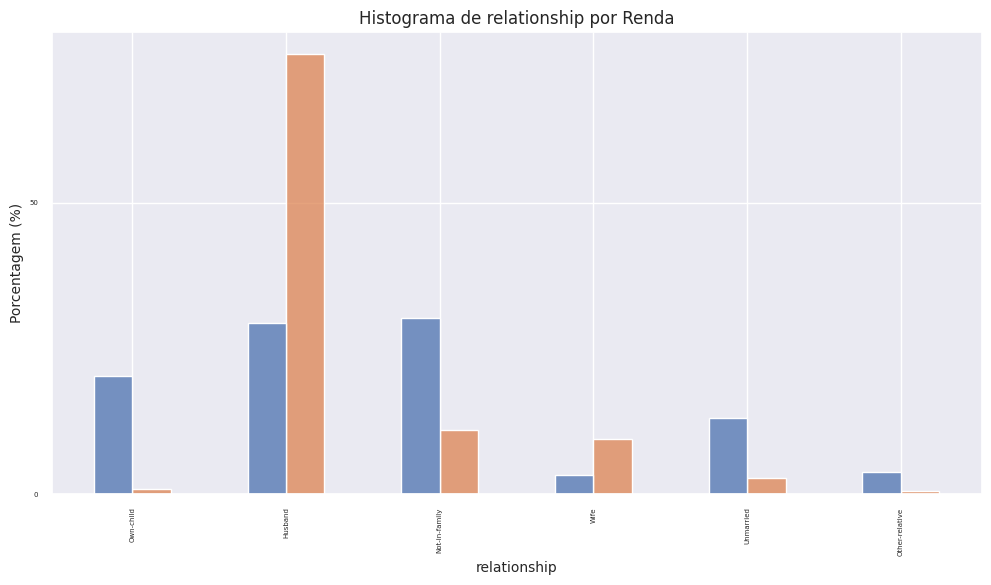

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

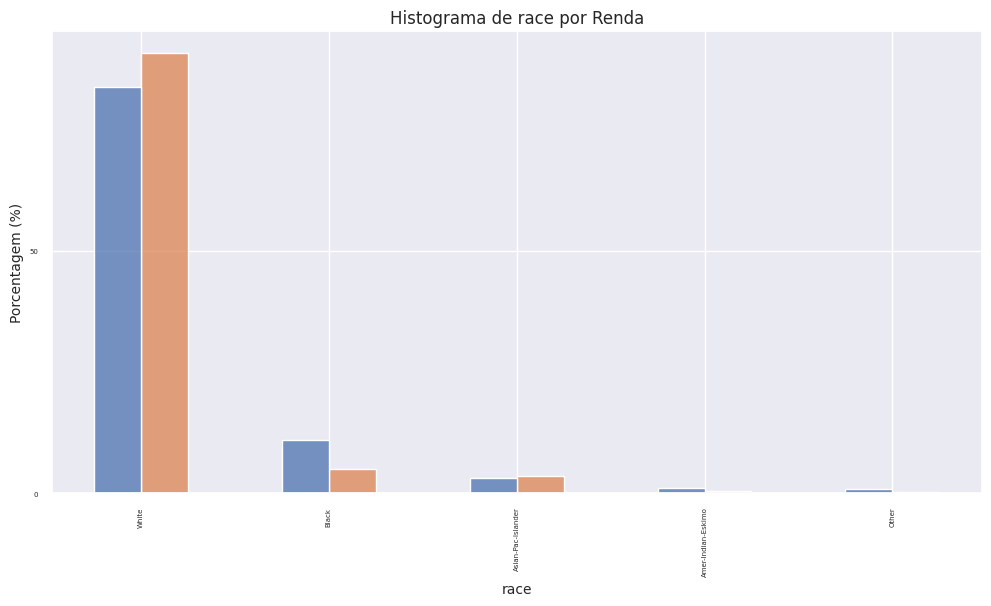

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

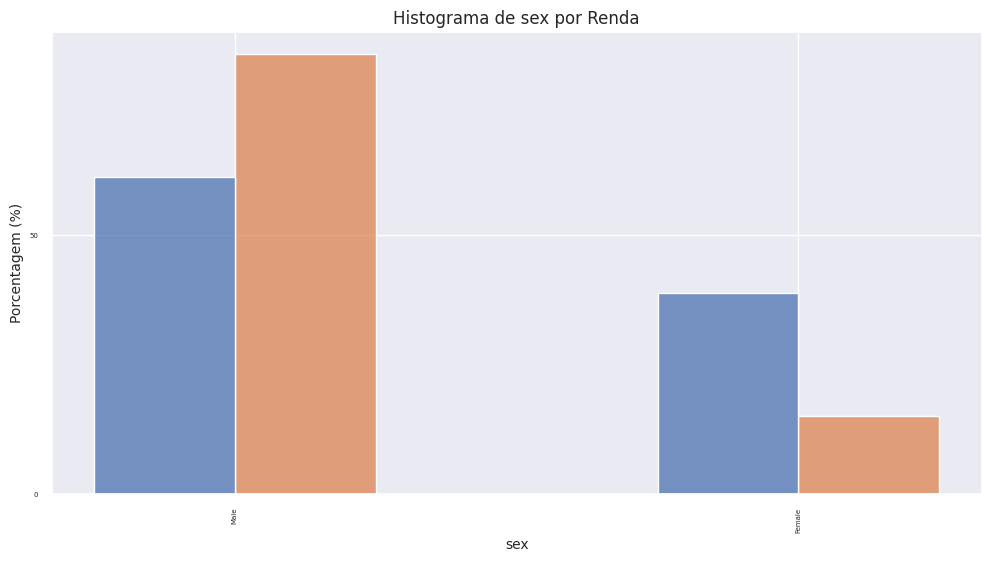

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

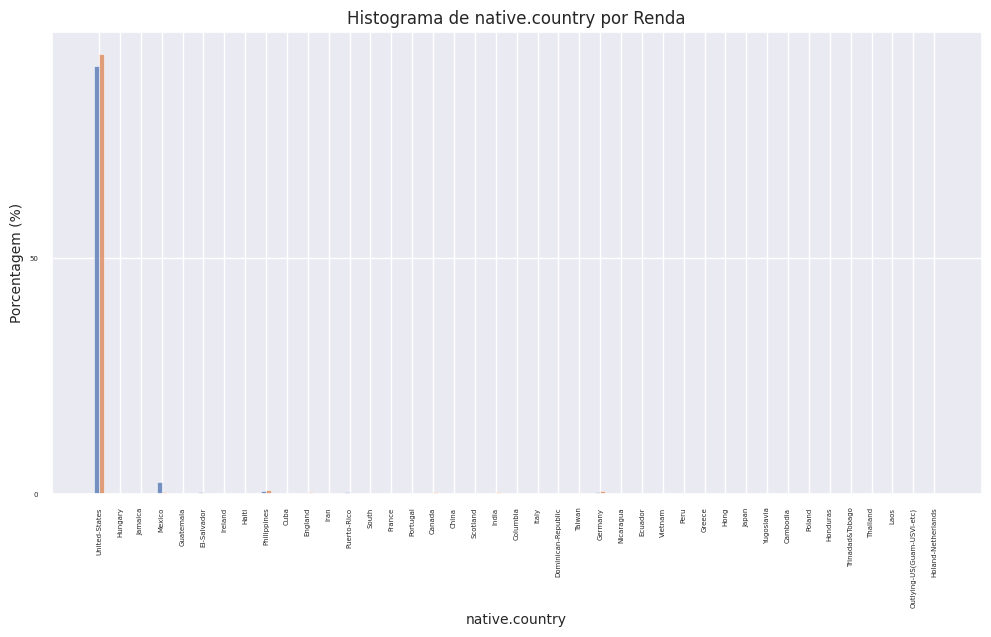

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

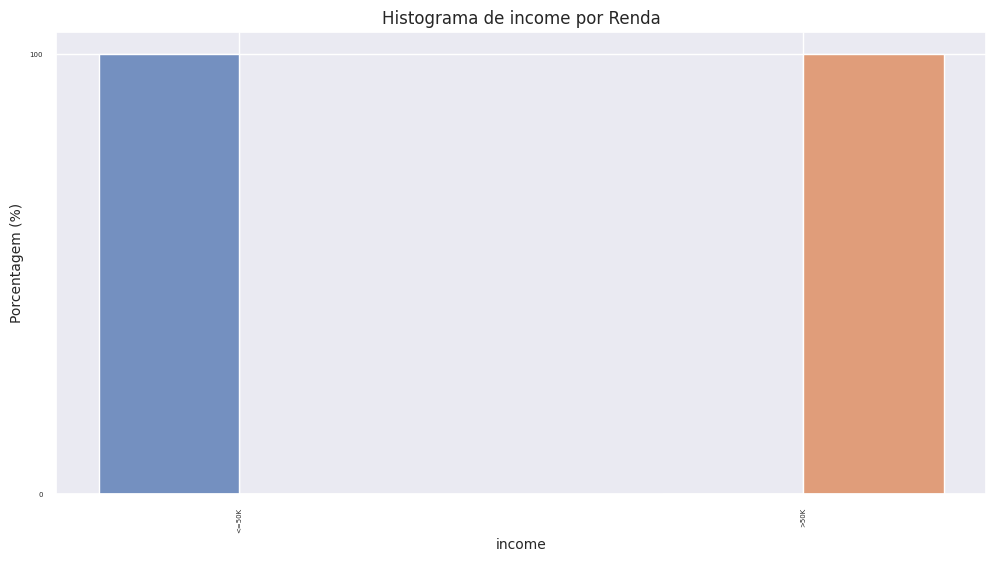

In [29]:
for coluna in dados_treino.columns:
  if pd.api.types.is_object_dtype(dados_treino[coluna]):
    HistPlot(dados_treino, coluna)
    print()

## Representação Numérica dos Dados

Nesta seção podemos observar uma distribuição absoluta dos dados. Aos missing Values, considerar sua proporção e peso antes de tomar possíveis decisões, tal como aos Outliers.

In [30]:
for coluna in dados_treino:
  display(dados_treino[coluna].value_counts())

Id
16280    1
37982    1
37995    1
37994    1
37993    1
        ..
27128    1
27127    1
27126    1
27125    1
48839    1
Name: count, Length: 32560, dtype: int64

age
36    898
31    888
34    886
23    877
35    876
     ... 
83      6
85      3
88      3
86      1
87      1
Name: count, Length: 73, dtype: int64

workclass
Private             22696
Self-emp-not-inc     2541
Local-gov            2093
State-gov            1297
Self-emp-inc         1116
Federal-gov           960
Without-pay            14
Never-worked            7
Name: count, dtype: int64

fnlwgt
203488    13
164190    13
123011    13
121124    12
126675    12
          ..
72208      1
115551     1
209174     1
103840     1
27620      1
Name: count, Length: 21647, dtype: int64

education
HS-grad         10501
Some-college     7291
Bachelors        5354
Masters          1723
Assoc-voc        1382
11th             1175
Assoc-acdm       1067
10th              933
7th-8th           646
Prof-school       576
9th               514
12th              433
Doctorate         413
5th-6th           333
1st-4th           168
Preschool          51
Name: count, dtype: int64

education.num
9     10501
10     7291
13     5354
14     1723
11     1382
7      1175
12     1067
6       933
4       646
15      576
5       514
8       433
16      413
3       333
2       168
1        51
Name: count, dtype: int64

marital.status
Married-civ-spouse       14976
Never-married            10682
Divorced                  4443
Separated                 1025
Widowed                    993
Married-spouse-absent      418
Married-AF-spouse           23
Name: count, dtype: int64

occupation
Prof-specialty       4140
Craft-repair         4099
Exec-managerial      4066
Adm-clerical         3769
Sales                3650
Other-service        3295
Machine-op-inspct    2002
Transport-moving     1597
Handlers-cleaners    1370
Farming-fishing       994
Tech-support          928
Protective-serv       649
Priv-house-serv       149
Armed-Forces            9
Name: count, dtype: int64

relationship
Husband           13193
Not-in-family      8304
Own-child          5068
Unmarried          3446
Wife               1568
Other-relative      981
Name: count, dtype: int64

race
White                 27815
Black                  3124
Asian-Pac-Islander     1039
Amer-Indian-Eskimo      311
Other                   271
Name: count, dtype: int64

sex
Male      21789
Female    10771
Name: count, dtype: int64

capital.gain
0        29849
15024      347
7688       284
7298       246
99999      159
         ...  
1455         1
6097         1
22040        1
7978         1
4931         1
Name: count, Length: 119, dtype: int64

capital.loss
0       31041
1902      202
1977      168
1887      159
1848       51
        ...  
1944        1
2201        1
2282        1
2489        1
155         1
Name: count, Length: 92, dtype: int64

hours.per.week
40    15216
50     2819
45     1824
60     1475
35     1297
      ...  
74        1
82        1
92        1
87        1
94        1
Name: count, Length: 94, dtype: int64

native.country
United-States                 29169
Mexico                          643
Philippines                     198
Germany                         137
Canada                          121
Puerto-Rico                     114
El-Salvador                     106
India                           100
Cuba                             95
England                          90
Jamaica                          81
South                            80
China                            75
Italy                            73
Dominican-Republic               70
Vietnam                          67
Guatemala                        64
Japan                            62
Poland                           60
Columbia                         59
Taiwan                           51
Haiti                            44
Iran                             43
Portugal                         37
Nicaragua                        34
Peru                             31
France                           29
Greece       

income
<=50K    24719
>50K      7841
Name: count, dtype: int64

## Relações Entre Variáveis

### Entre Numéricas

In [31]:
"""
  PairPlot
"""

def PairPlot(df, atributos):
    sns.set_context("notebook", font_scale=0.8)  # Ajuste o font_scale conforme necessário
    plt.figure(figsize=(30, 15))
    pair_plot = sns.pairplot(df,
                             hue='income',
                             vars=atributos,
                             palette="viridis"
                             )

    # Ajuste das labels dos eixos
    for ax in pair_plot.axes.flatten():
        ax.set_xticklabels(ax.get_xticklabels(), fontsize=10)  # Ajuste o fontsize para os rótulos do eixo x
        ax.set_yticklabels(ax.get_yticklabels(), fontsize=10)  # Ajuste o fontsize para os rótulos do eixo y

    plt.show()

In [32]:
"""
  BoxPlot
"""

def BoxPlot(df):
  plt.figure(figsize=(10,6))
  sns.boxplot(data=df, orient="h")
  plt.title('BoxPlot dos Dados')
  plt.xlabel('Valores')
  plt.show()

In [33]:
"""
  HeatMap
"""

def HeatMap(df):
  # Plotando a matriz de correlações usando um Heatmap para dar cor aos números
  sns.set_context(font_scale=1.9)
  plt.figure(figsize=(12,8))
  sns.heatmap(
  df.corr(), #Fonte dos dados, nossa matriz de correlação
  annot=True, #Anotar os valores das correlações nas caixinhas coloridas
  fmt='.2f', # Formato float de 2 dígitos, para arredondar os números
  cmap='RdBu' # Mapa de cores do vermelho (menor) para o azul (maior)
  )
  plt.show()

In [34]:
atributos = []

for coluna in dados_treino.columns:
  if pd.api.types.is_numeric_dtype(dados_treino[coluna]):
    atributos.append(coluna)

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

<Figure size 3000x1500 with 0 Axes>

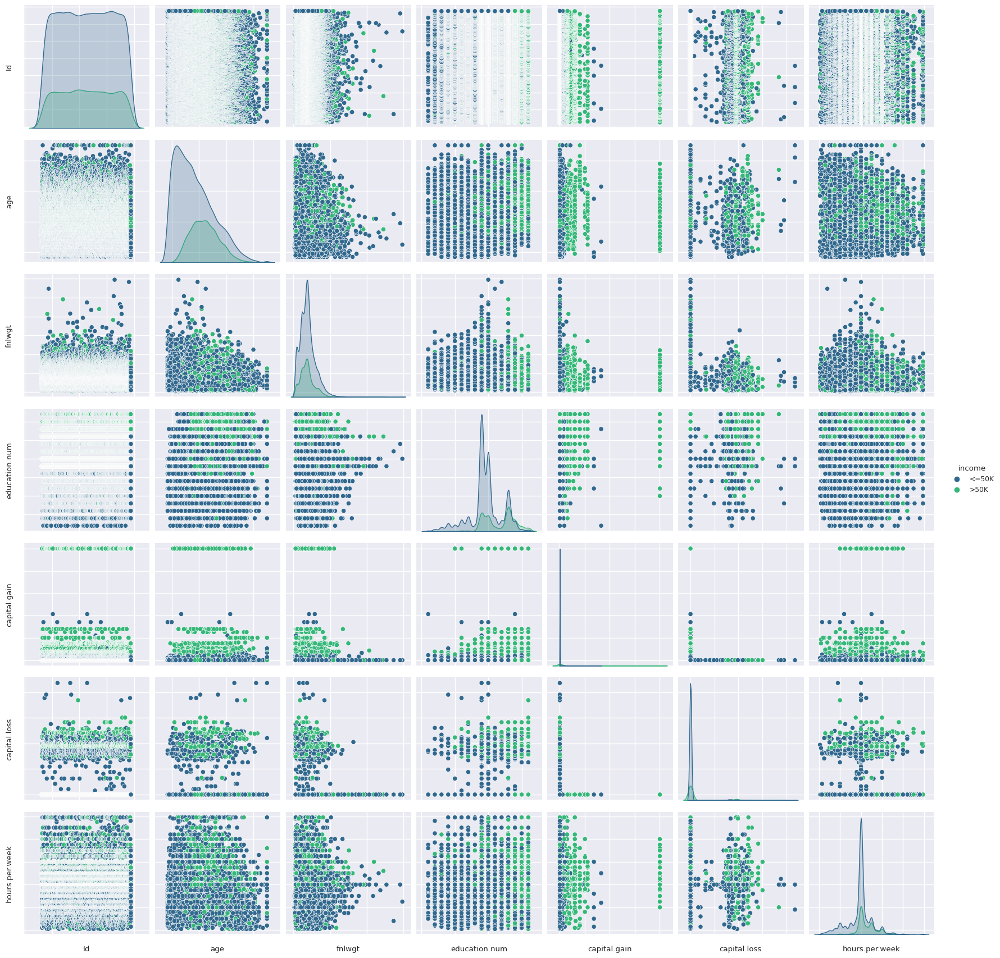

In [35]:
PairPlot(dados_treino, atributos)

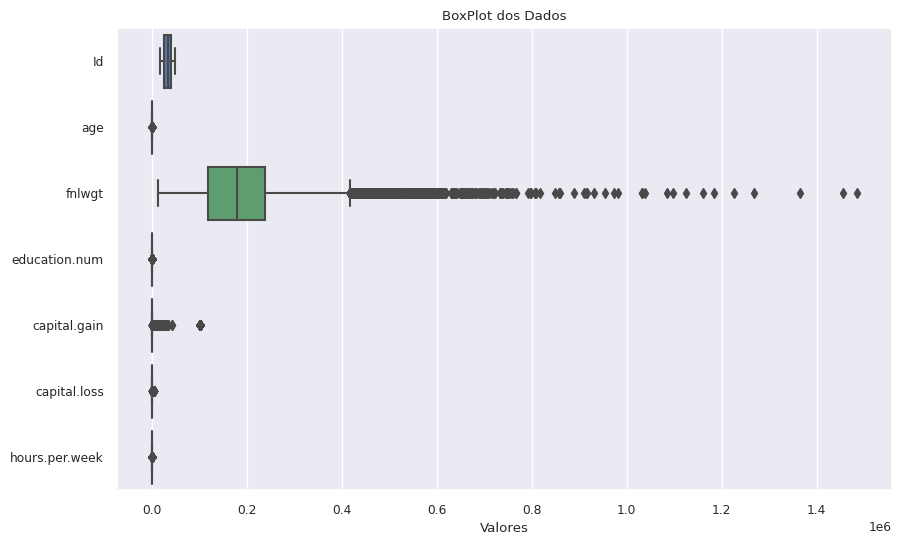

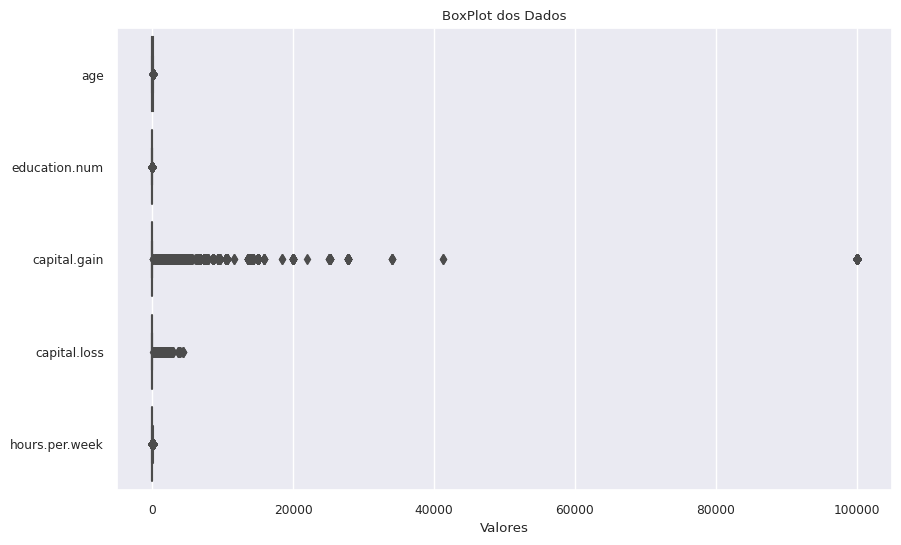

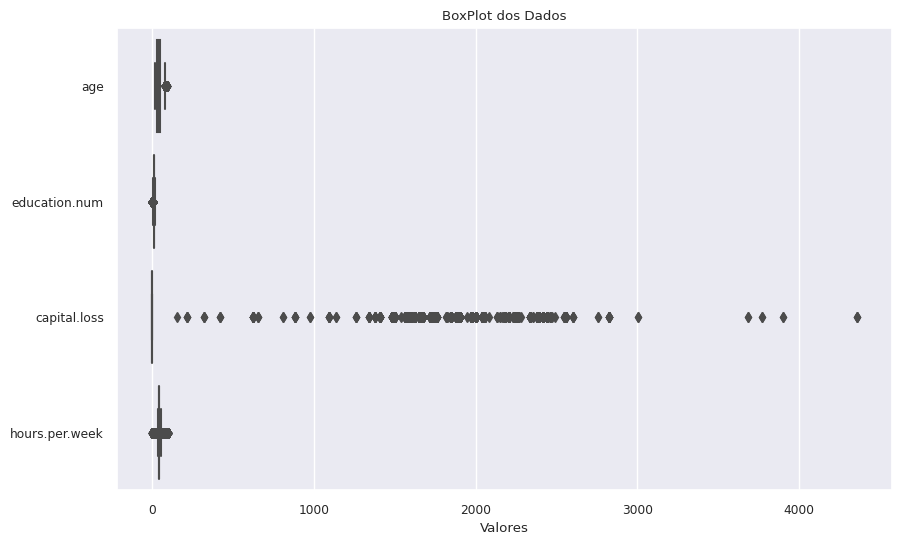

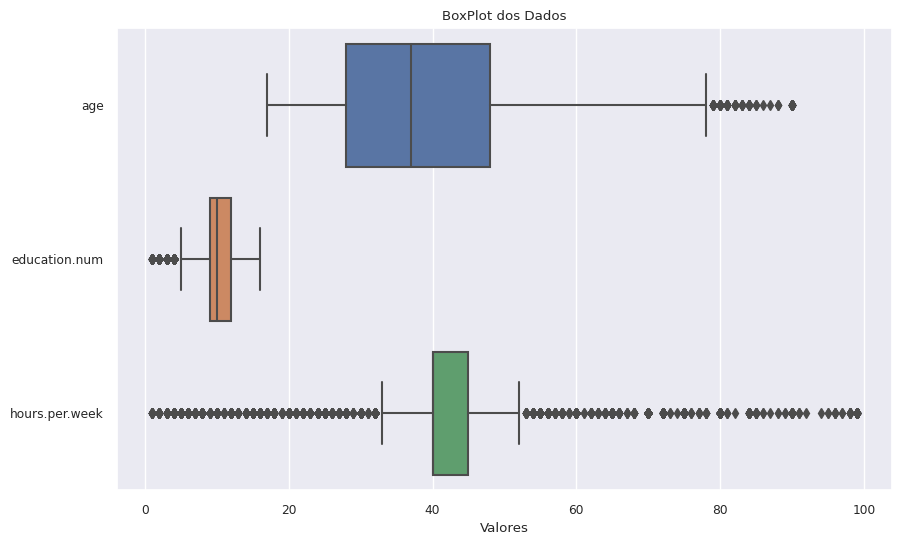

In [36]:
BoxPlot(dados_treino)
BoxPlot(dados_treino[['age', 'education.num', 'capital.gain', 'capital.loss', 'hours.per.week']])
BoxPlot(dados_treino[['age', 'education.num', 'capital.loss', 'hours.per.week']])
BoxPlot(dados_treino[['age', 'education.num', 'hours.per.week']])

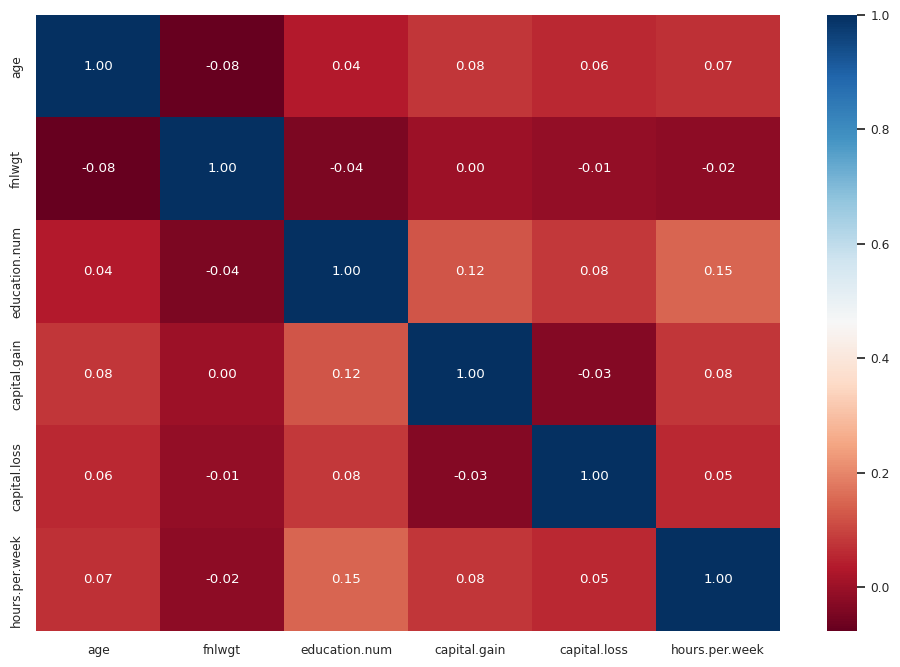

In [37]:
HeatMap(dados_treino[['age', 'fnlwgt', 'education.num', 'capital.gain', 'capital.loss', 'hours.per.week']])

In [38]:
def BoxPlot2(df, colunas_numericas):
  sns.set(font_scale=1.2)
  # Cria os 'espaços' para que possamos plotar os gráficos. Faremos um grid de 3 linhas por 4 colunas (o 3,4 na função)
  fig, eixo = plt.subplots(2,3,figsize=(20,12)) # Criando uma figura e 12 eixos, em uma matriz de 3 linhas x 4 colunas
  # Para cada linha
  for linha in range(2):
      # Para cada coluna
      for coluna in range(3):
          # Verifica se existe um nome de coluna na lista 'colunas_numericas'
          if colunas_numericas[linha][coluna] != '':
              # Se sim faz o plot do Boxplot naquela linha e coluna, indicando no eixo vertical/y sempre a variável 'aprovado'
              sns.boxplot(data=dados_treino,x=colunas_numericas[linha][coluna],y='income',ax=eixo[linha][coluna],orient='h',palette='Set2')

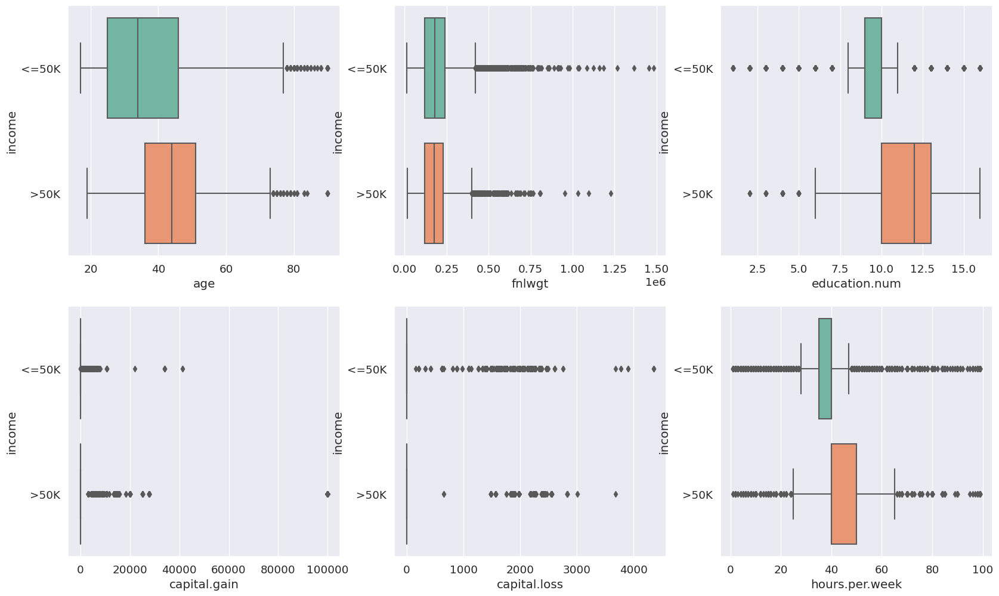

In [39]:
BoxPlot2(dados_treino, [['age', 'fnlwgt', 'education.num'], ['capital.gain', 'capital.loss', 'hours.per.week']])

### Entre Não Numéricas

In [40]:
def HistPlotNN(df, atributo1, atributo2):
  plt.figure(figsize=(8,4))
  sns.histplot(x = df[atributo1], hue=df[atributo2], multiple="dodge", stat = 'percent', shrink = 0.8, common_norm=False)
  plt.xticks(fontsize=8,rotation = 90)
  plt.yticks(fontsize=8)
  plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

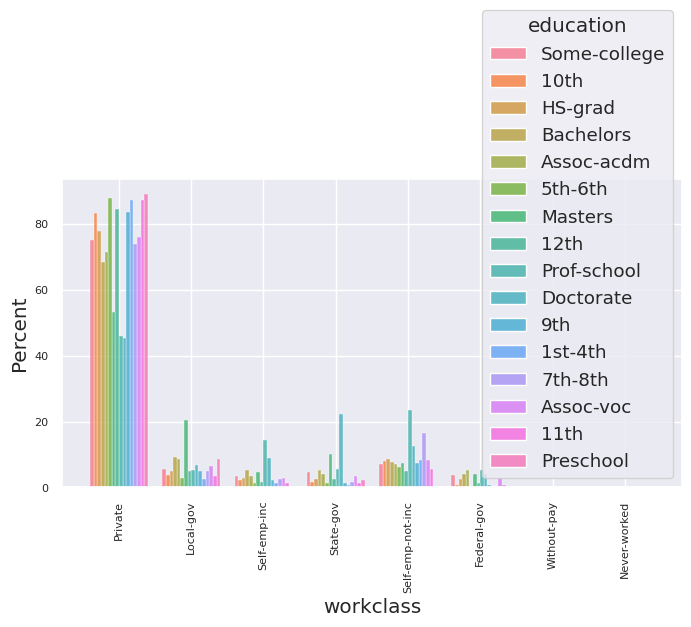

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

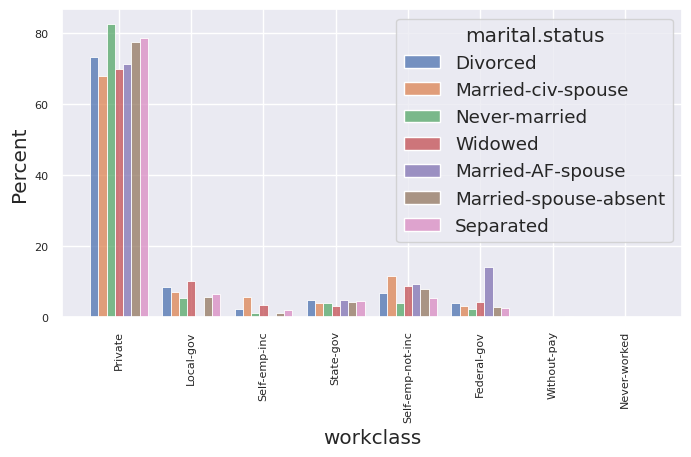

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

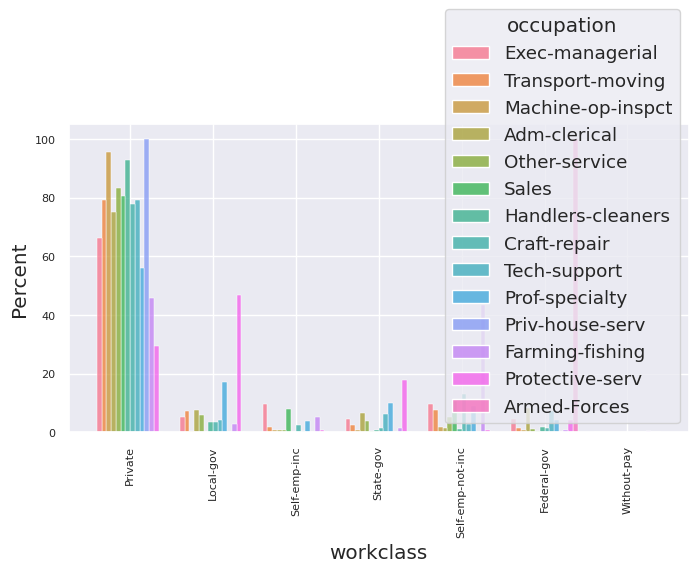

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

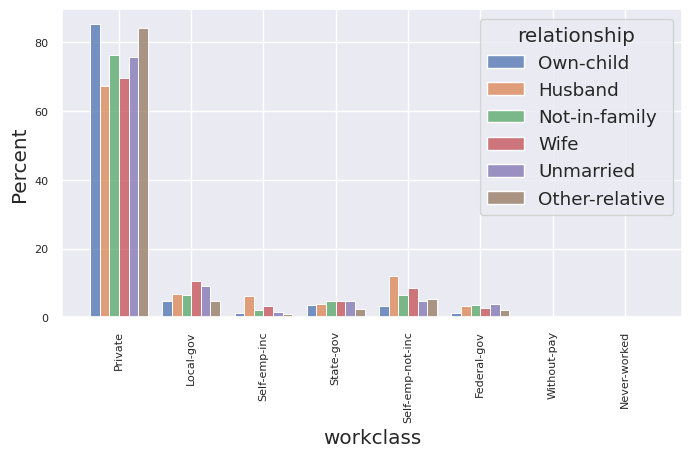

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

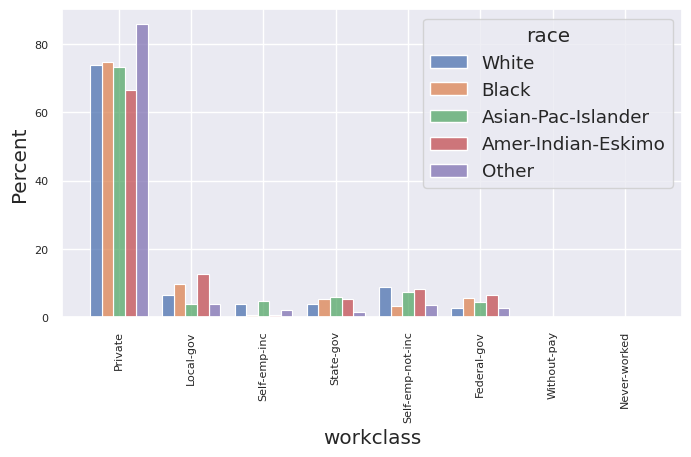

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

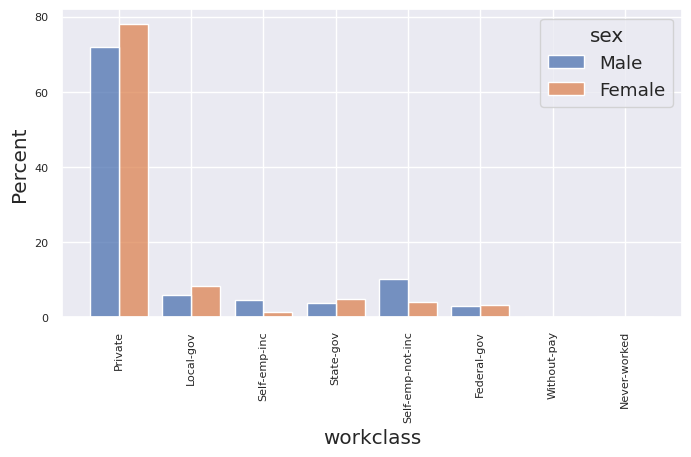

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

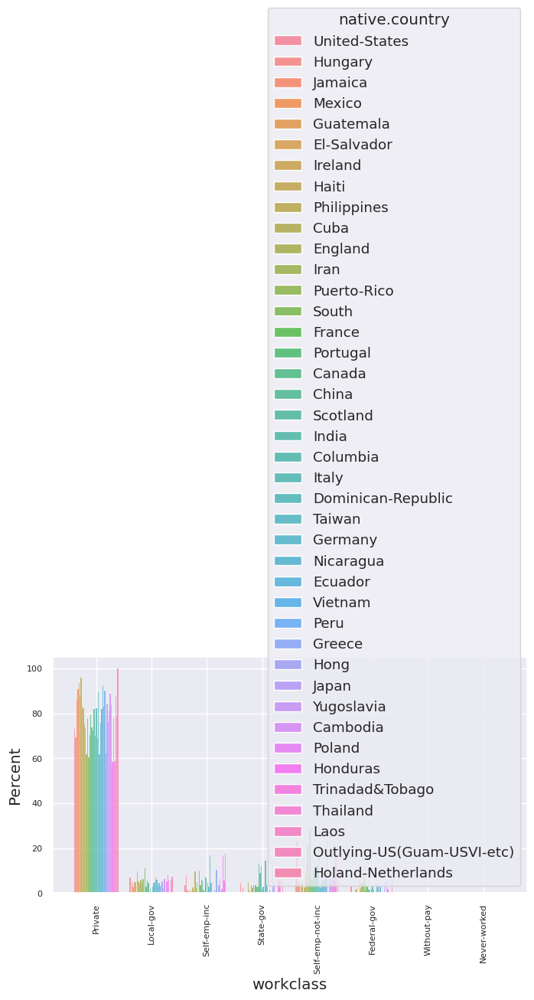

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

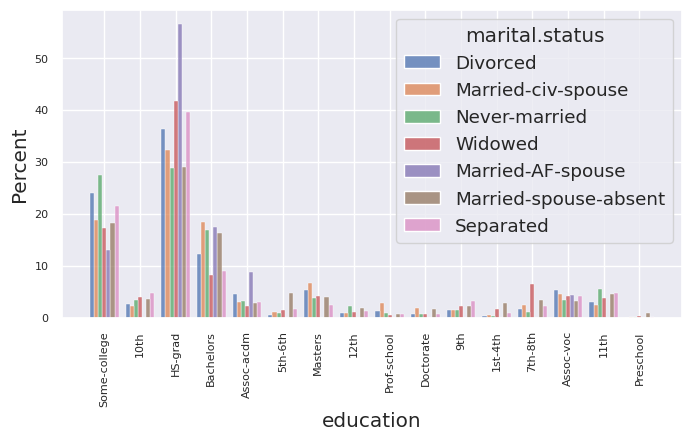

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

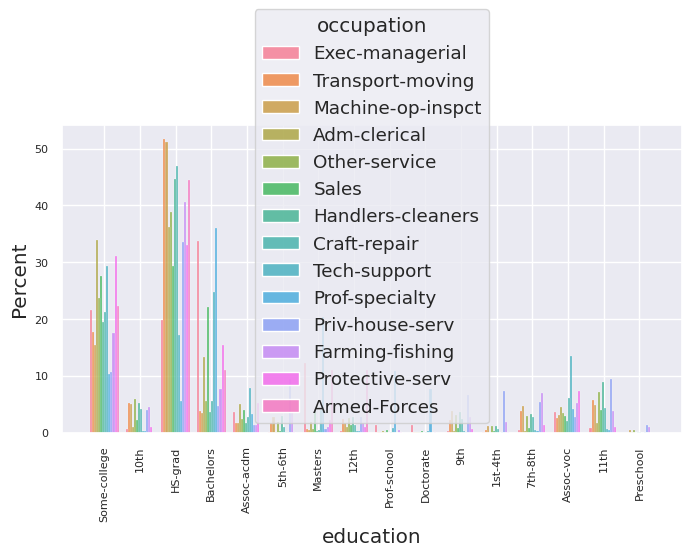

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

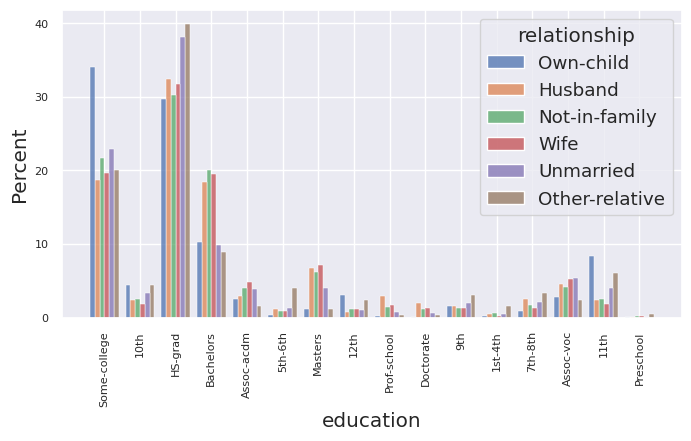

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

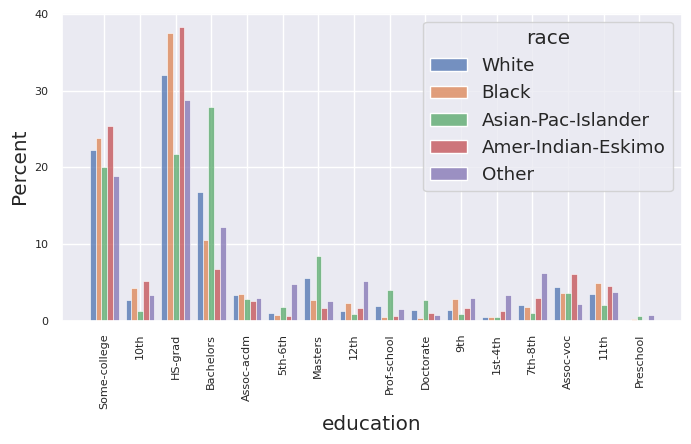

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

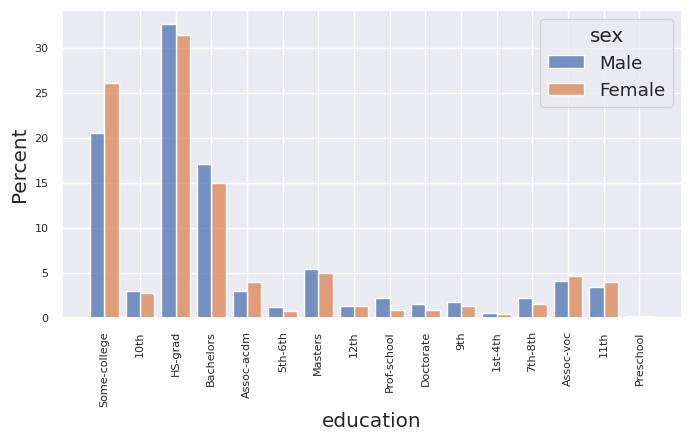

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

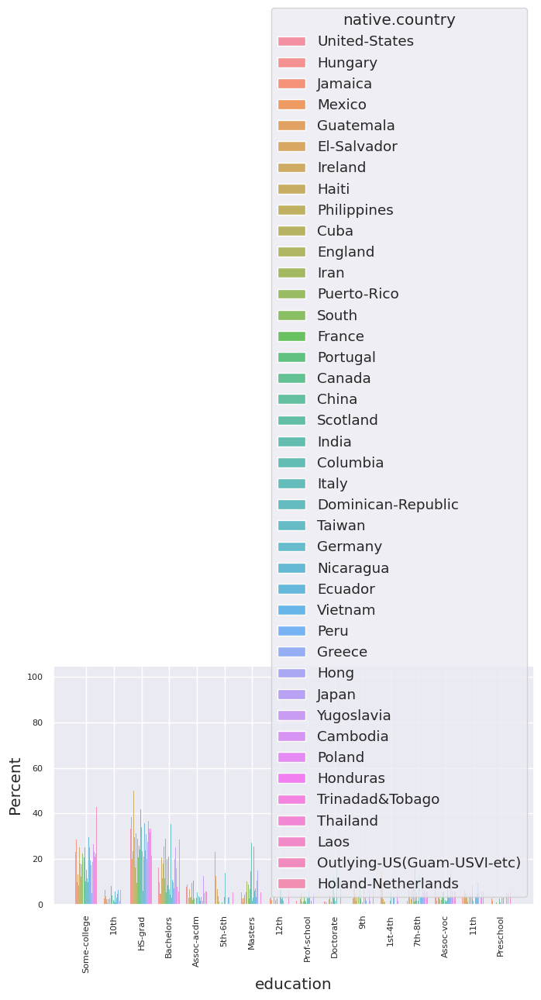

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

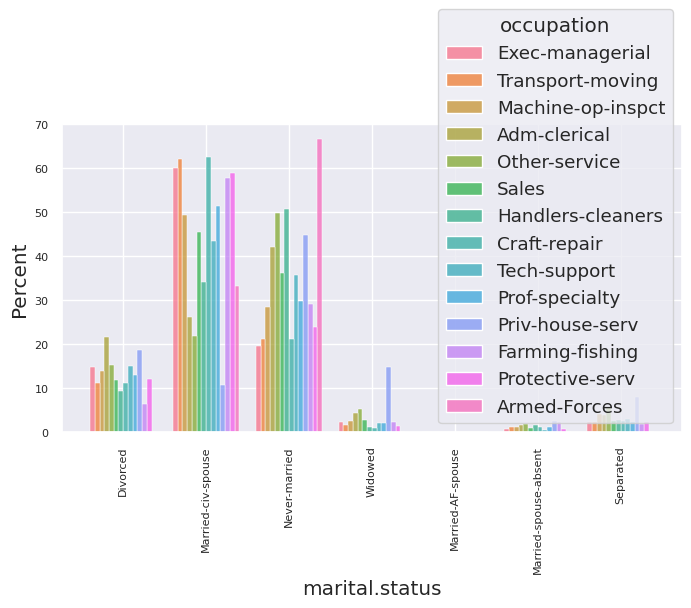

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

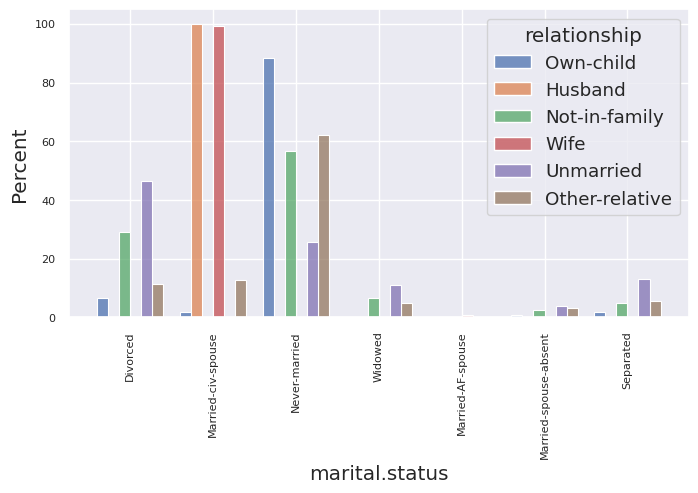

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

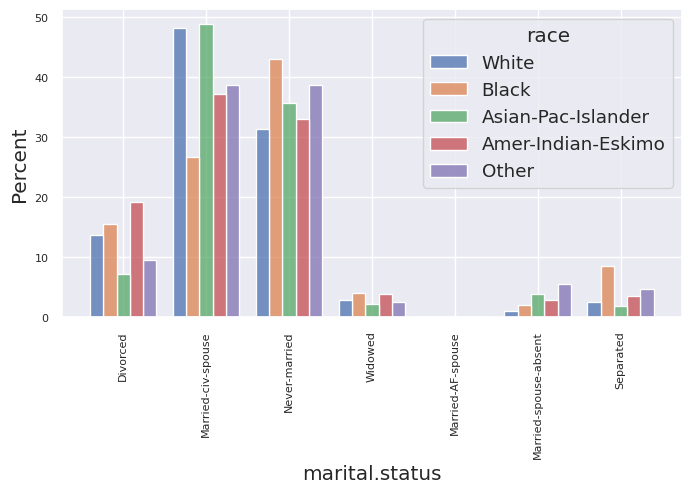

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

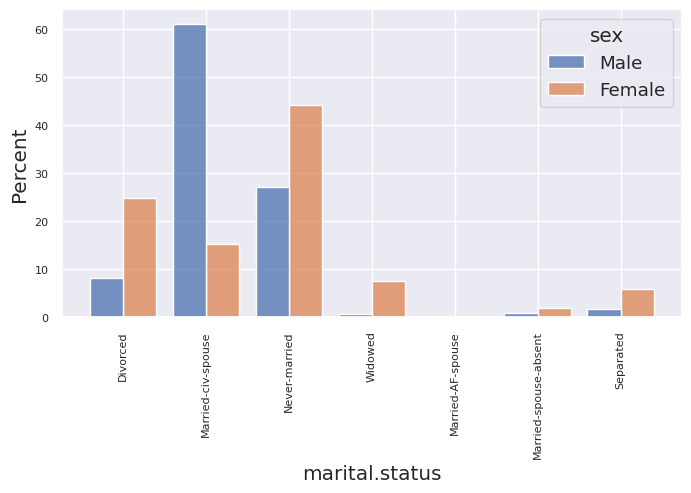

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

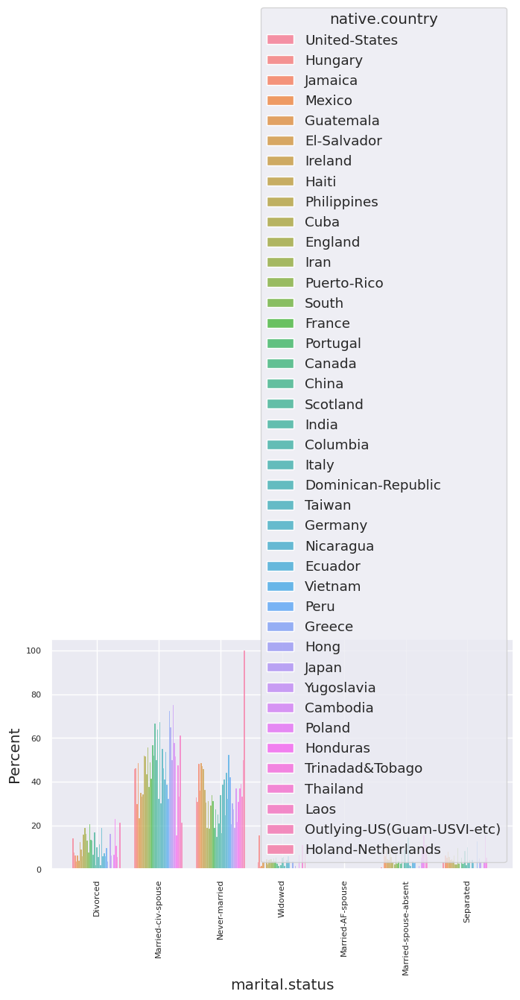

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

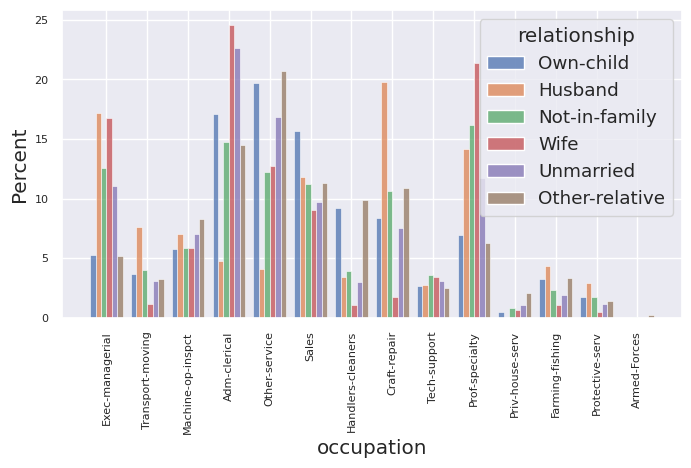

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

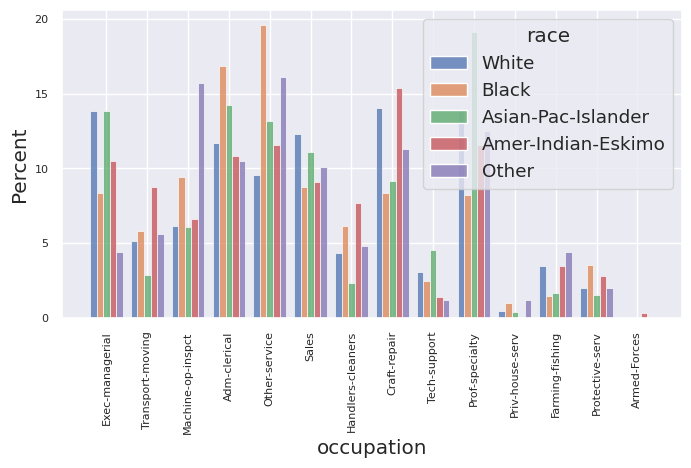

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

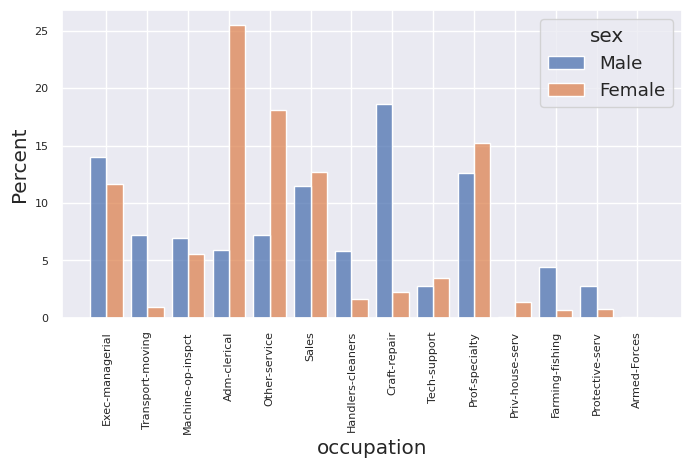

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

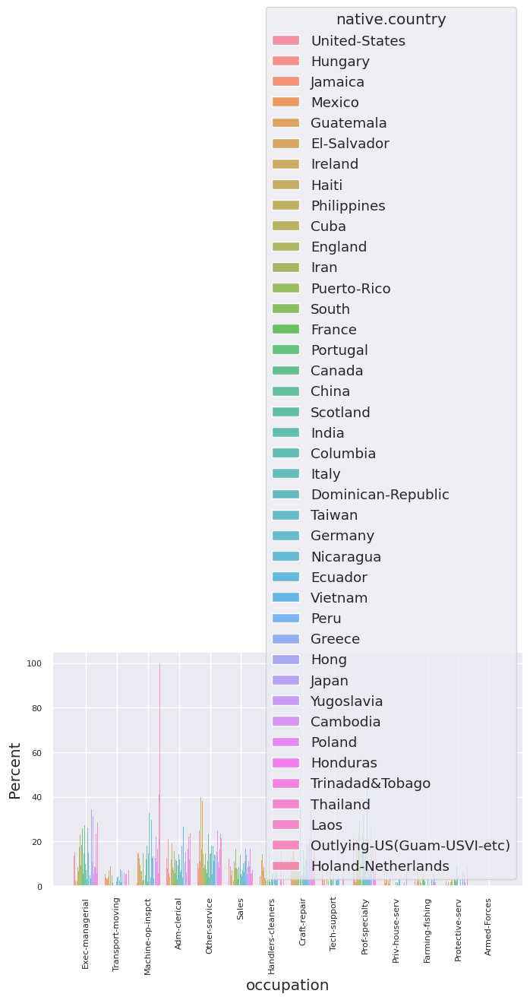

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

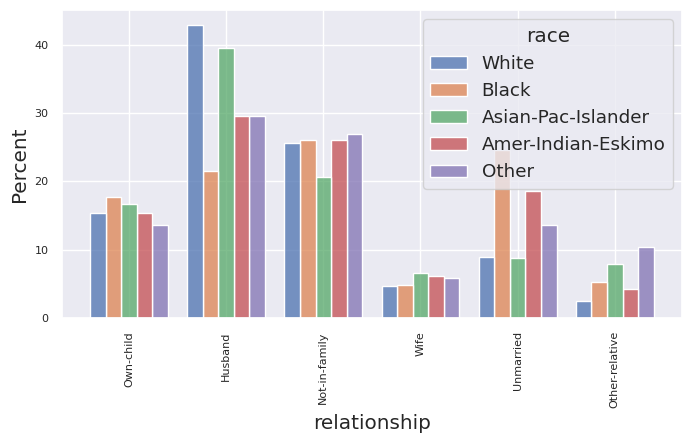

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

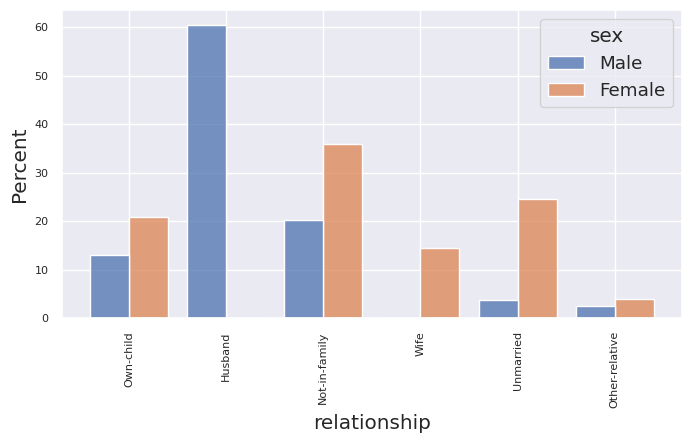

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

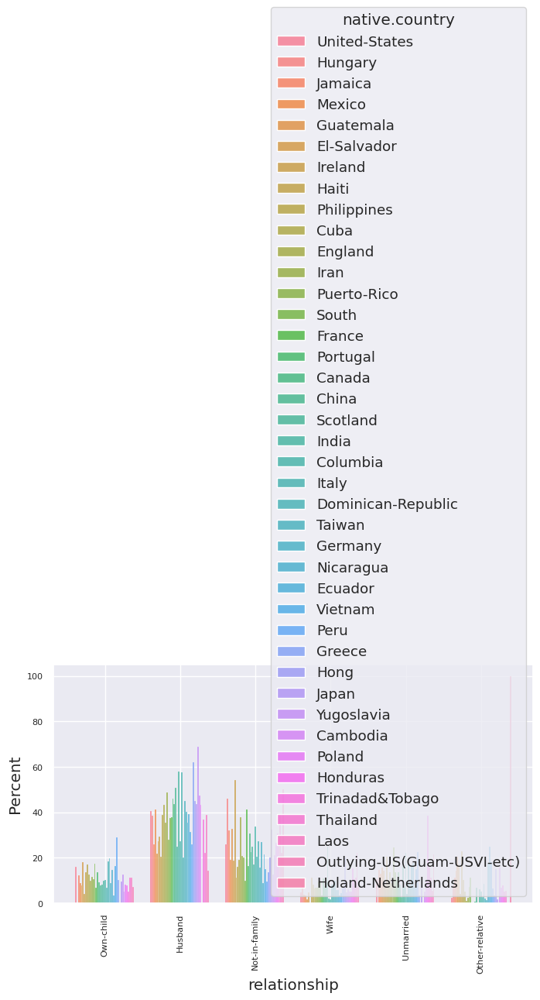

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

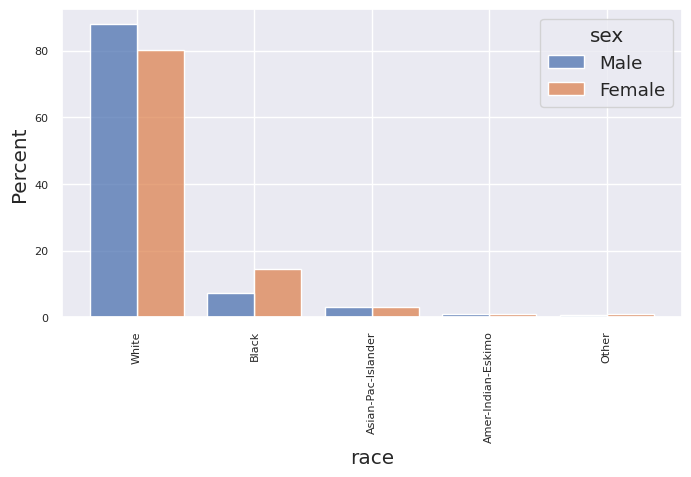

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

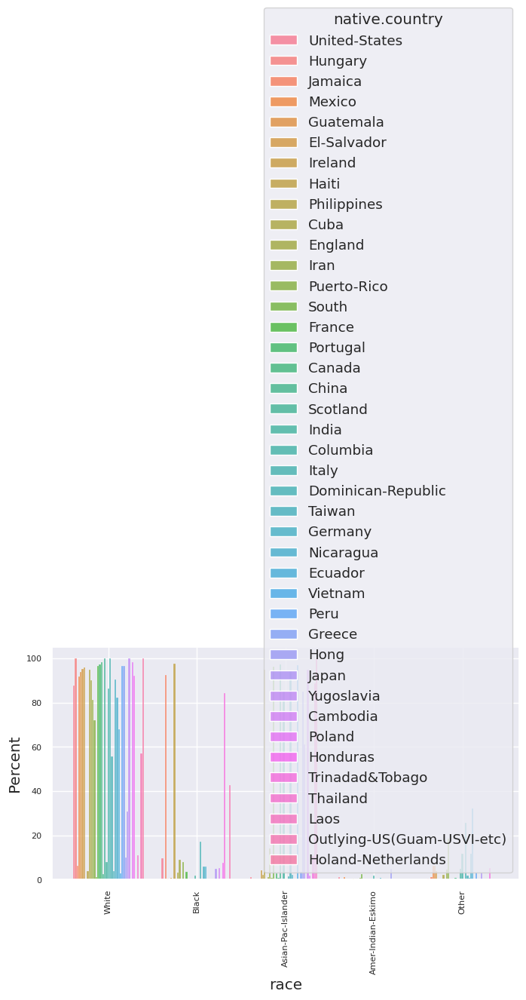

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

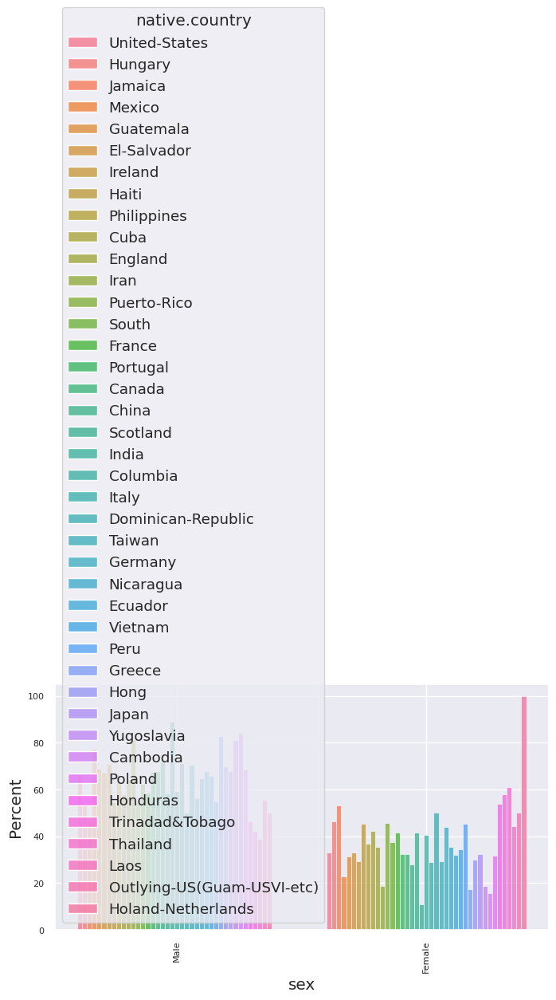

In [41]:
atributos = ['workclass', 'education', 'marital.status', 'occupation', 'relationship', 'race', 'sex', 'native.country']

for i in range(0, len(atributos)):
  for j in range(i + 1, len(atributos)):
    HistPlotNN(dados_treino, atributos[i], atributos[j])

### Entre Numérica e Não Numérica

In [42]:
def ViolinPlot2(df, atributoN, atributoO):
  plt.figure(figsize=(12,6))
  sns.violinplot(x=atributoO, y=atributoN, data=df)
  plt.xticks(fontsize=16,rotation = 90)
  plt.yticks(fontsize=16)
  plt.show()

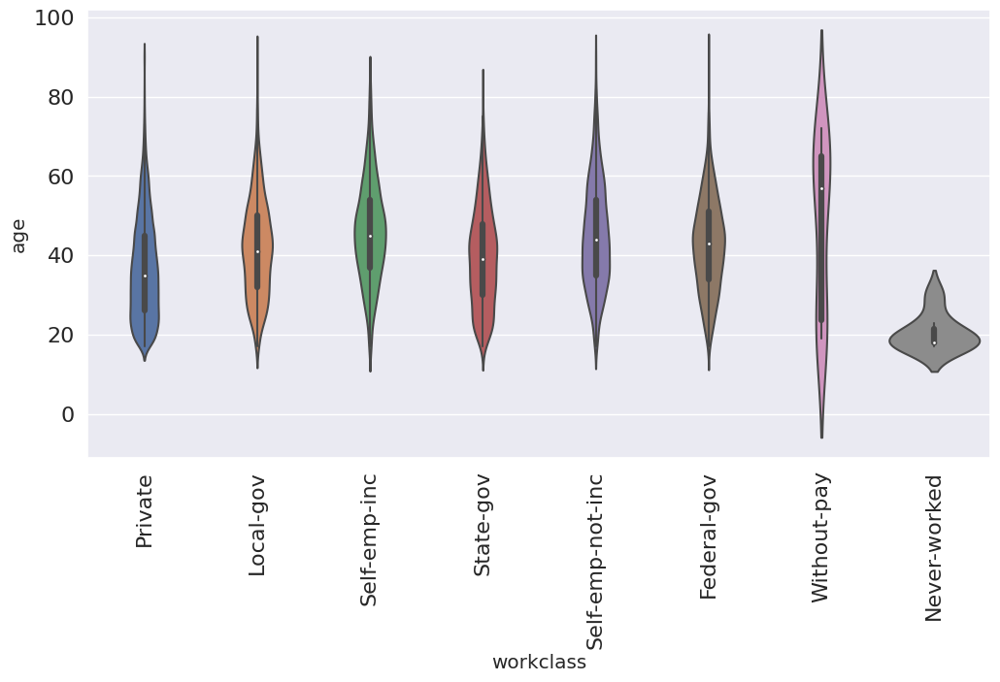

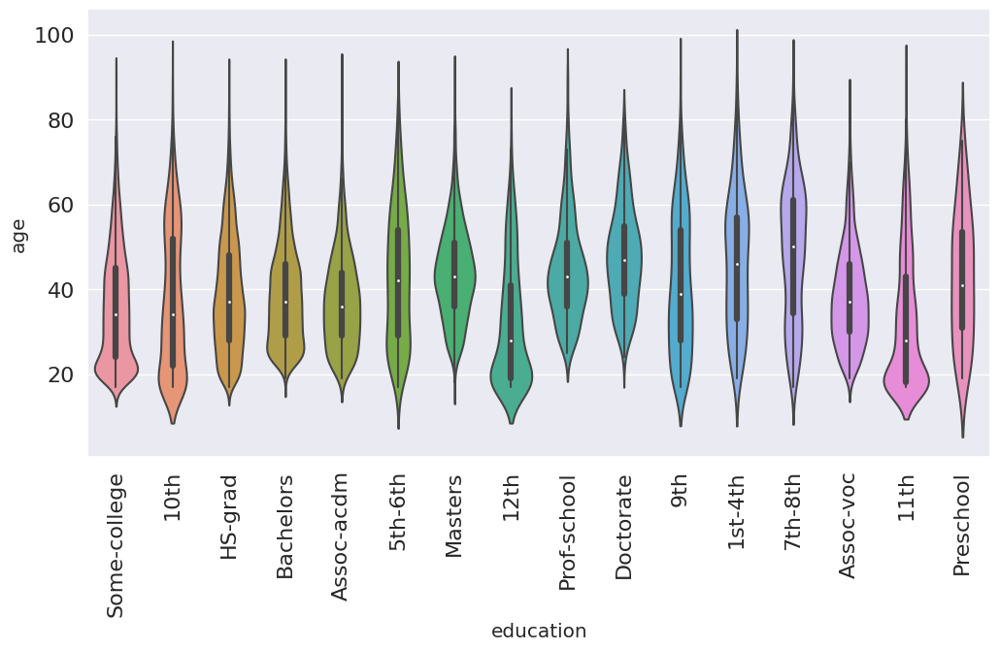

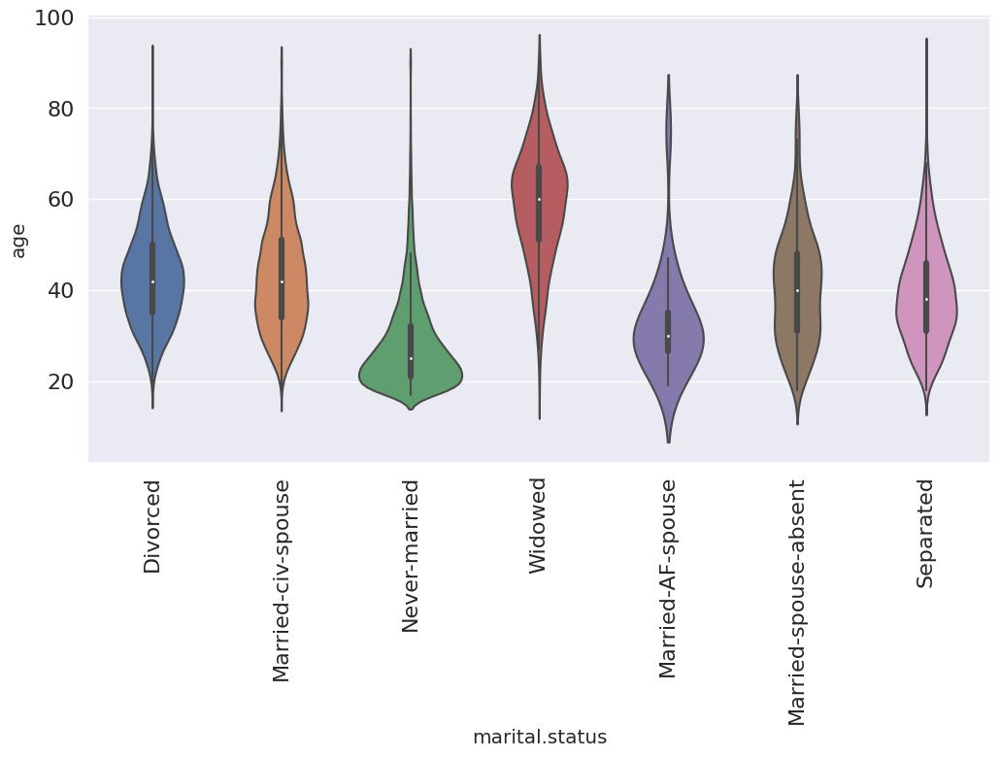

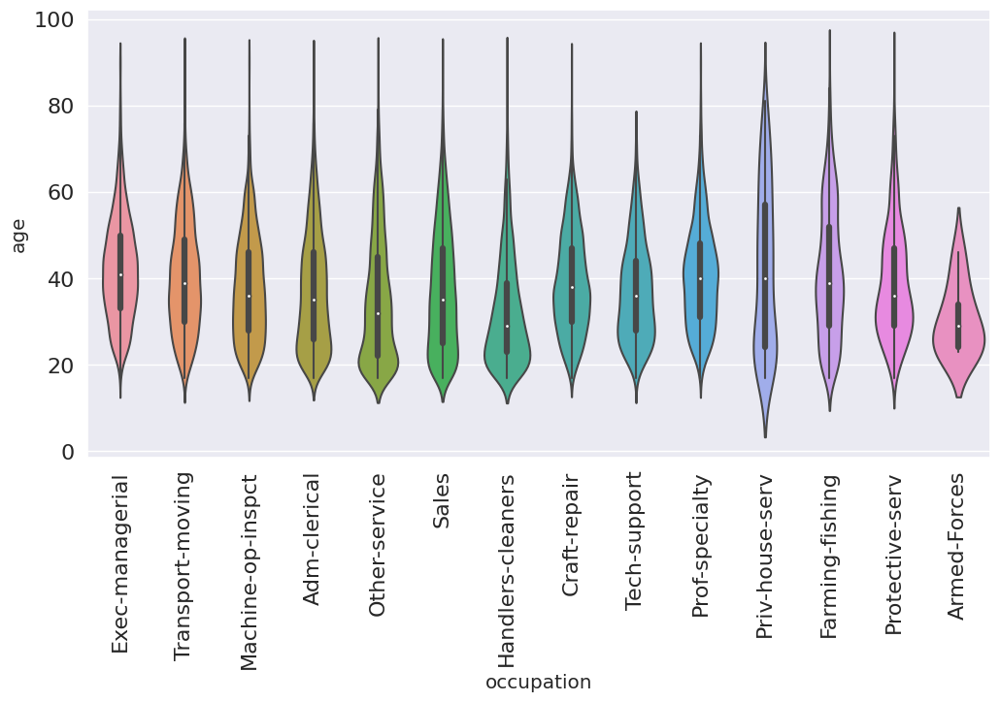

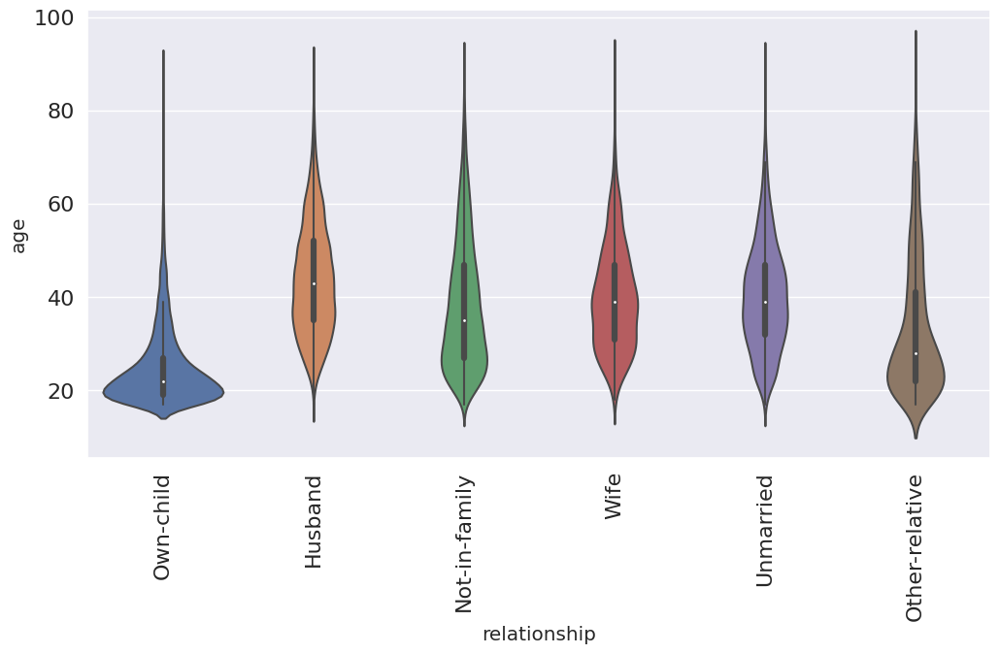

...

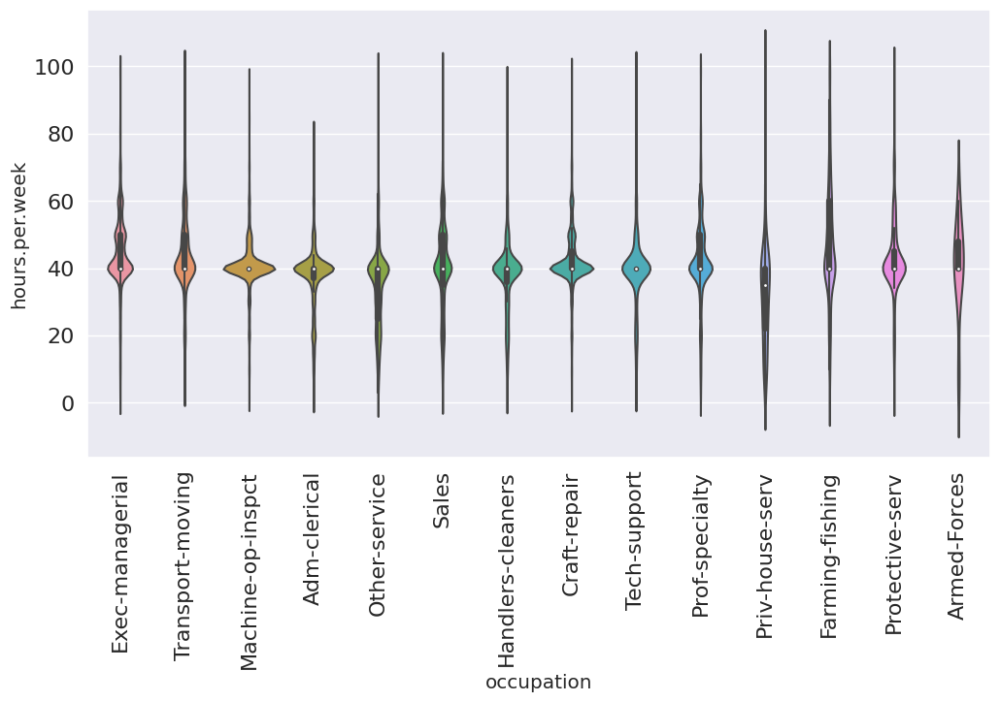

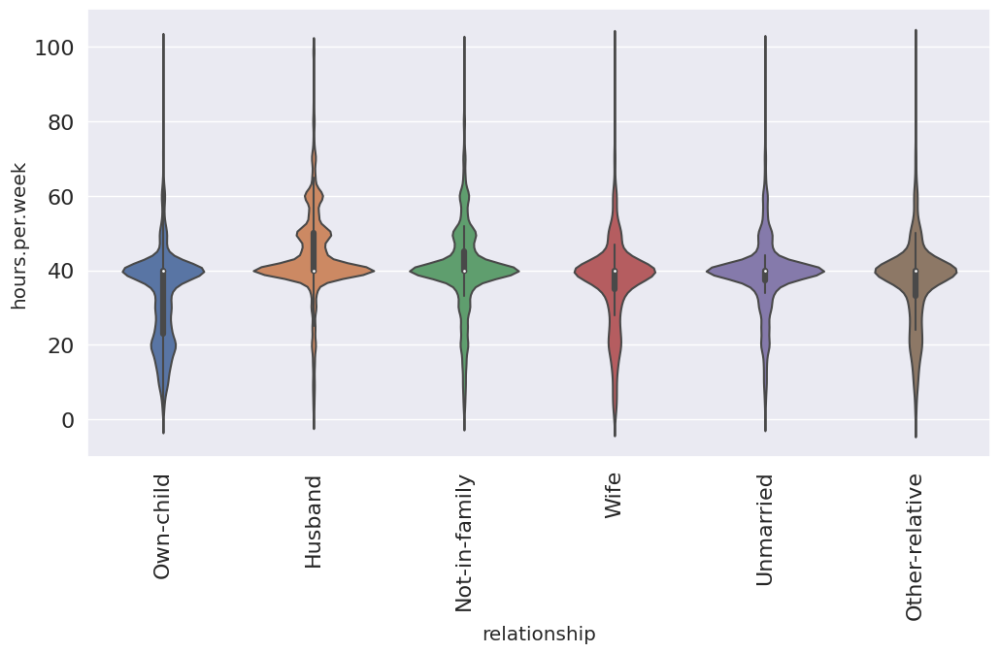

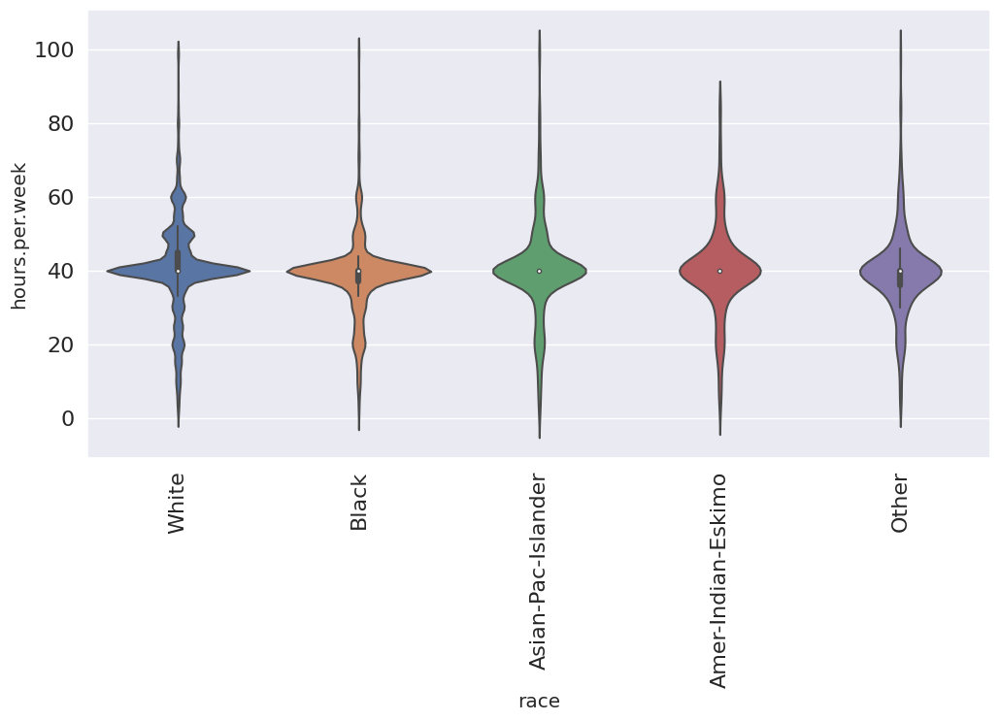

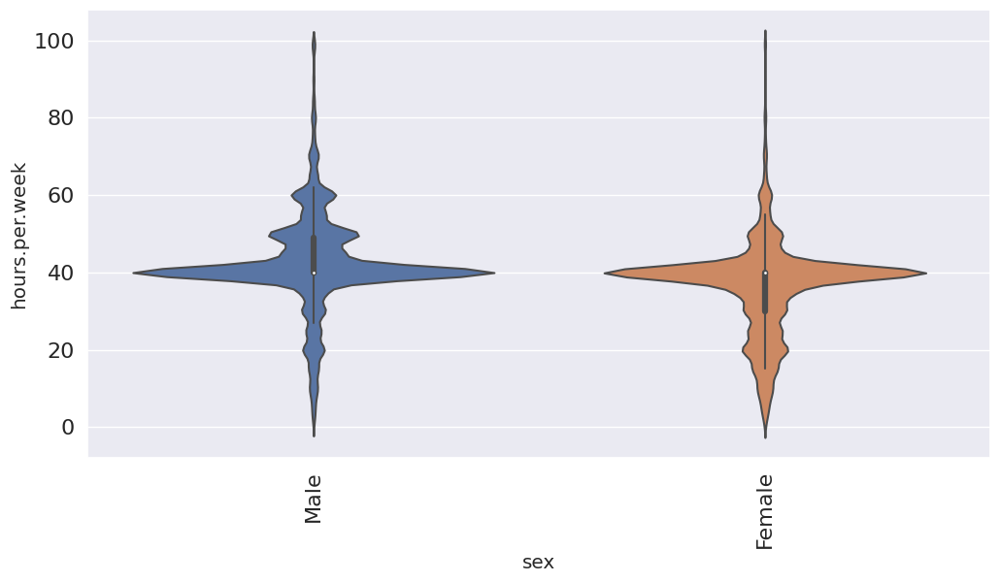

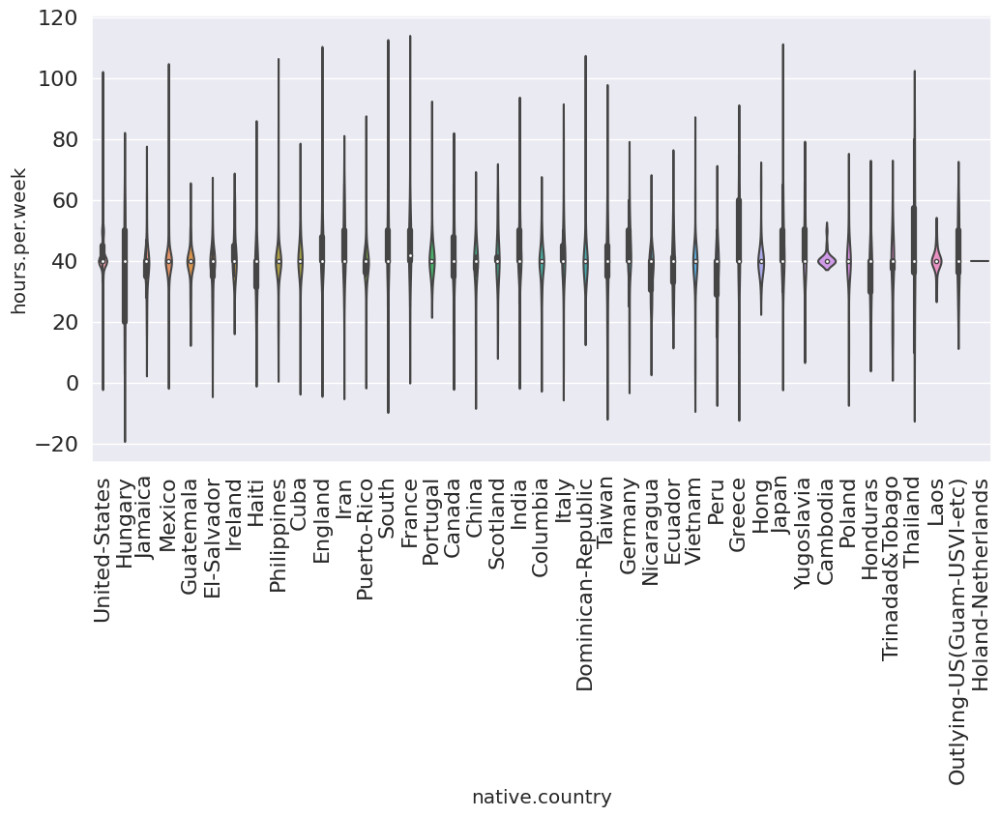

In [43]:
atributo_num = ['age', 'fnlwgt', 'education.num', 'capital.gain', 'capital.loss', 'hours.per.week']
atributo_cat = ['workclass', 'education', 'marital.status', 'occupation', 'relationship', 'race', 'sex', 'native.country']

for i in range(0, len(atributo_num)):
  for j in range(0, len(atributo_cat)):
    ViolinPlot2(dados_treino, atributo_num[i], atributo_cat[j])

# Tratamento de Missing Values e Outliers

## Substituindo ? Por NaN

Em alguns atributos, verificamos que valores nulos são dados com "?". No indicativo .info() estes registros não foram visíveis, em razão desta opção. Assim, vamos substituí-los por NaN, que é perceptível pelo Pandas.

In [44]:
dados_treino = dados_treino.replace('?', np.nan)
dados_teste = dados_teste.replace('?', np.nan)

In [45]:
dados_treino.info()
dados_teste.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Id              32560 non-null  int64 
 1   age             32560 non-null  int64 
 2   workclass       30724 non-null  object
 3   fnlwgt          32560 non-null  int64 
 4   education       32560 non-null  object
 5   education.num   32560 non-null  int64 
 6   marital.status  32560 non-null  object
 7   occupation      30717 non-null  object
 8   relationship    32560 non-null  object
 9   race            32560 non-null  object
 10  sex             32560 non-null  object
 11  capital.gain    32560 non-null  int64 
 12  capital.loss    32560 non-null  int64 
 13  hours.per.week  32560 non-null  int64 
 14  native.country  31977 non-null  object
 15  income          32560 non-null  object
dtypes: int64(7), object(9)
memory usage: 4.0+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex:

## Tratamento de Outliers e Missing values

### Variáveis Numéricas

Pela ScatterMatrix, podemos observar algumas variáveis que se comportam bem na presença de outras, enquanto outras, nem tanto.

Em especial, ganhos de capital é nítida a disjunção entre as classes da Target, para qualquer outra combinação.

Perdas de capital, por outro lado, não esboçam uma grande nitidez entre as classes. Assim, facilitando uma confusão na execução do knn.

Observando cuidadosamente, podemos combinar education.num, age, capital.gain e hour.per.week, cujas interações se mostram bem amigáveis na hora de selecionar os dados.

#### Age

Pelas nossas análises anteriores, o atributo "Age" possui

1. **Média:** 38.58
2. **Desvio Padrão:** 13.64
3. **Min:** 17
4. **25%:** 28
5. **Mediana:** 37
6. **75%** 48
7. **Max:** 90

Não possui Missing Values

1. Apresenta dados pouco representativos a partir de 76 anos.
2. Para aqueles que recebem <=50K, os outliers começam em 78 anos e os que recebem >50K, a partir dos 72 anos.
3. A densidade dos dados se dá entre os 20 e os 30 anos.
4. O gráfico é bem distribuído.

#### Estratégia:

1. O uso de uma tendência central para cubir os outliers é desencorajado.
2. Vamos reagrupar os dados por faixa etária. Dada a distribuição apresentada, vamos fazer a seguinte distribuição
['<20', '20-24', '25-34', '35-44', '45-54', '55-64', '65-74', '75-79', '80+']

Na coluna abaixo, verifique que os valores acima de 80 anos estão fragmentados e pouco significativos. Logo é interessante rearranjá-los numa superclasse.

In [46]:
display(dados_treino['age'].value_counts().tail(15))
display(dados_teste['age'].value_counts().tail(15))

age
76    46
75    45
90    43
77    29
78    23
80    22
79    22
81    20
82    12
84    10
83     6
85     3
88     3
86     1
87     1
Name: count, dtype: int64

age
74    26
77    25
76    23
81    17
80    16
90    12
78    11
79     8
83     5
84     3
82     3
88     3
85     2
89     2
87     2
Name: count, dtype: int64

In [47]:
# Define os intervalos das faixas etárias
bins = [0, 20, 25, 35, 45, 55, 65, 75, 80, 100]

# Define os labels para cada faixa etária
labels = ['<20', '20-24', '25-34', '35-44', '45-54', '55-64', '65-74', '75-79', '80+']

# Aplica o agrupamento
dados_treino['age'] = pd.cut(dados_treino['age'], bins=bins, labels=labels, right=False)
dados_teste['age'] = pd.cut(dados_teste['age'], bins=bins, labels=labels, right=False)

#### Fnlwgt (***)

Pelas nossas análise anteriores, o atributo "Fnlwgt" possui

1. **Média:** 1.897818e+05
2. **Desvio Padrão:** 1.055498e+05
3. **Min:** 1.228500e+04
4. **25%:** 1.178315e+05
5. **Mediana:** 1.783630e+05
6. **75%:** 2.370545e+05
7. **Max:** 1.484705e+06

Não possui Missing Values

1. Outliers aparecem em ambas as categorias. Contudo, verifica-se que a média é próxima da mediana. Logo, pontos sensíveis são alguns poucos outliers.

#### Estratégia

Vamos usar a técnica da Winsorização, com percentual de 95%.

#### Education Number

Pelas nossas análises anteriores, o atributo "Education.num" possui

1. **Média:** 10.08
2. **Desvio Padrão:** 2.57
3. **Min:** 1
4. **25%:** 9
5. **Mediana:** 10
6. **75%:** 12
7. **Max:** 16

Não possui Missing values

1. Outliers aparecem em ambas categorias. Contudo, verifica-se uma tendência de maiores salários para os que possuem maior escolaridade.

#### Estratégia

Vamos usar agrupamentos para tentar uniformizar a situação
  - Ensino Fundamental I [0, 5]
  - Ensino Fundamental II [5, 9]
  - Ensino Médio [9, 12]
  - Ensino Superior Incompleto [12, 14]
  - Enino Superior Completo [14, 16]

In [48]:
dados_treino['education.num'].value_counts()

education.num
9     10501
10     7291
13     5354
14     1723
11     1382
7      1175
12     1067
6       933
4       646
15      576
5       514
8       433
16      413
3       333
2       168
1        51
Name: count, dtype: int64

In [49]:
# Define os intervalos dos grupos de escolaridade
bins = [0, 5, 9, 12, 14, 16]

# Define os labels para cada grupo
labels = ['Fundamental I', 'Fundamental II', 'Médio', 'Superior Incompleto', 'Superior Completo']

# Cria a nova coluna 'education_group' com os grupos de escolaridade
dados_treino['education.num'] = pd.cut(dados_treino['education.num'], bins=bins, labels=labels, right=False)
dados_teste['education.num'] = pd.cut(dados_teste['education.num'], bins=bins, labels=labels, right=False)

#### Capital Gain

Pelas nossas análises anteriores, o atributo "Capital Gain" possui

1. **Média:** 1077.61
2. **Desvio Padrão:** 7385.40
3. **Min:** 0
4. **25%:** 0
5. **Mediana:** 0
6. **75%:** 0
7. **Max:** 99999

Não possui Missing values

1. Apresenta outliers concentrados.
2. Para aqueles que recebem <=50K, os outliers são bem mais concentrados à tendência central dos dados.
3. O gráfico é extremamente denso em 0 para <=50K.
4. O desvio padrão é extremamente alto e a média é deslocada em relação à mediana. Portanto, a média é inútil nessa situação.
5. Apesar de não ser tão denso como os que recebem <=50K, aqueles que recebem >50K também possuem alguma concentração perto ao zero.

#### Estratégia:

1. Como boa parte dos dados se concentra em zero, vamos aplicar uma transformação logarítmica para dar menos influência de outliers sobre os nosso dados

In [50]:
# Aplica a transformação logarítmica (adicionando 1 para evitar log de 0)
dados_treino['capital.gain'] = np.log(dados_treino['capital.gain'] + 1)
dados_teste['capital.gain'] = np.log(dados_teste['capital.gain'] + 1)

#### Capital Loss

Pelas nossas análises anteriores, o atributo "Capital Loss" possui

1. **Média:** 87.30
2. **Desvio Padrão:** 402.96
3. **Min:** 0
4. **25%:** 0
5. **Mediana:** 0
6. **75%:** 0
7. **Max:** 4356

Não possui Missing values

1. Apresenta a medida central mais concentrada, com outliers mais próximos.
2. Para aqueles que recebem menos do que 50K, há uma distribuição mais esparsa, porém, próxima a 0.
3. Por outro lado, para os mais ricos, há uma maior concentração em torno da mediana.

#### Estratégia:

1. Como boa parte dos dados se concentra em zero, vamos aplicar uma transformação logarítmica para dar menos influência de outliers sobre os nosso dados

#### Hours Per Week

Pelas nossas análises anteriores, o atributo "Hours Per Week" possui

1. **Média:** 40.43
2. **Desvio Padrão:** 12.34
3. **Min:** 1
4. **25%:** 40
5. **Mediana:** 40
6. **75%:** 45
7. **Max:** 99

Não possui Missing Values

1. Novamente, observando o gráfico, verificamos que pessoas que ganham mais, trabalham mais tempo. Por outro lado, pessoas que trabalham menos, recebem menos.
2. Há um pico considerável às 40 horas, que servem tanto para os que recebem menos do que 50K e os que recebem mais.

#### Estratégia

1. Como as 40 horas são comportilhadas entre os grupos, não é prudente sensibilizar a média.
2. Então, vamos usar a técnica da winsorização novamente, 5% e 95%.

In [51]:
dados_treino['hours.per.week'] = winsorize(dados_treino['hours.per.week'], limits=[0.05, 0.05])
dados_teste['hours.per.week'] = winsorize(dados_teste['hours.per.week'], limits=[0.05, 0.05])

In [52]:
"""
  Income
"""
# Dicionário com o mapeamento
income_map = {'<=50K': 0, '>50K': 1}

# Aplica o mapeamento à coluna 'income'
dados_treino['income'] = dados_treino['income'].map(income_map)

In [53]:
"""
  Age
"""
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoded_age = encoder.fit_transform(dados_treino[['age']])

encoded_df = pd.DataFrame(encoded_age, columns=encoder.get_feature_names_out(['age']))
dados_treino = pd.concat([dados_treino, encoded_df], axis=1)
dados_treino.drop('age', axis=1, inplace=True)

# Repita o processo para dados_teste
encoded_age_teste = encoder.transform(dados_teste[['age']])
encoded_df_teste = pd.DataFrame(encoded_age_teste, columns=encoder.get_feature_names_out(['age']))
dados_teste = pd.concat([dados_teste, encoded_df_teste], axis=1)
dados_teste.drop('age', axis=1, inplace=True)

In [54]:
"""
  Education Num
"""
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoded_age = encoder.fit_transform(dados_treino[['education.num']])

encoded_df = pd.DataFrame(encoded_age, columns=encoder.get_feature_names_out(['education.num']))
dados_treino = pd.concat([dados_treino, encoded_df], axis=1)
dados_treino.drop('education.num', axis=1, inplace=True)

# Repita o processo para dados_teste
encoded_age_teste = encoder.transform(dados_teste[['education.num']])
encoded_df_teste = pd.DataFrame(encoded_age_teste, columns=encoder.get_feature_names_out(['education.num']))
dados_teste = pd.concat([dados_teste, encoded_df_teste], axis=1)
dados_teste.drop('education.num', axis=1, inplace=True)

# Modelagem

## Setagem Inicial

In [55]:
df_train = dados_treino[['income', 'age_20-24', 'age_25-34',
       'age_35-44', 'age_45-54', 'age_55-64', 'age_65-74', 'age_75-79',
       'age_80+', 'age_<20', 'education.num_Fundamental I',
       'education.num_Fundamental II', 'education.num_Médio',
       'education.num_Superior Completo', 'education.num_Superior Incompleto',
       'education.num_nan', 'capital.gain', 'hours.per.week']]
dfFinal = dados_teste[['age_20-24', 'age_25-34',
       'age_35-44', 'age_45-54', 'age_55-64', 'age_65-74', 'age_75-79',
       'age_80+', 'age_<20', 'education.num_Fundamental I',
       'education.num_Fundamental II', 'education.num_Médio',
       'education.num_Superior Completo', 'education.num_Superior Incompleto',
       'education.num_nan', 'capital.gain', 'hours.per.week']]

In [56]:
X_train, X_val, Y_train, Y_val = train_test_split(df_train.drop('income',axis=1),
                                                  df_train['income'], 
                                                  train_size=0.7, 
                                                  random_state=42
                                                 )

In [57]:
Y_train.head()

21385    0
19749    0
1216     0
30048    1
23077    0
Name: income, dtype: int64

In [58]:
from sklearn.model_selection import KFold, cross_validate
from sklearn.neighbors import KNeighborsClassifier

acuracia = []
precisao = []
revocacao = []
f1 = []

for k in range(1, 33, 2):
    knn = KNeighborsClassifier(n_neighbors=k)
    
    # Geralmente, são 5 ou 10 folds
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    
    scoring = {'acc': 'accuracy',
           'prec_macro': 'precision_macro',
           'rec_macro': 'recall_macro',
          'f1' : 'f1_macro'}
    scores = cross_validate(knn, X_train, Y_train.values.ravel(), scoring=scoring,
                         cv=kf)
    
    acuracia.append({k, scores['test_acc'].mean()})
    precisao.append({k, scores['test_prec_macro'].mean()})
    revocacao.append({k, scores['test_rec_macro'].mean()})
    f1.append({k, scores['test_f1'].mean()})

In [59]:
print(acuracia)
print(precisao)
print(revocacao)
print(f1)

[{0.7695240145752231, 1}, {0.781764503254632, 3}, {0.7808007267784738, 5}, {0.7872509049841477, 7}, {0.8014218243937586, 9}, {0.804536427037599, 11}, {0.8093193805058554, 13}, {0.8107230046388046, 15}, {0.811381159178557, 17}, {0.8108107528026333, 19}, {0.8129605972534449, 21}, {0.8138819481613069, 23}, {0.813355420679635, 25}, {0.8103280175931363, 27}, {0.8112493877503486, 29}, {0.8113813420473859, 31}]
[{0.6812655673251463, 1}, {0.7010505503995755, 3}, {0.6983944237568791, 5}, {0.7097137898451862, 7}, {0.732443763571807, 9}, {0.7396829864562225, 11}, {0.7554804693983325, 13}, {0.755961171689987, 15}, {0.7587695409552131, 17}, {0.7567754339796867, 19}, {0.764054554855776, 21}, {0.7653014461293287, 23}, {0.7654355417122648, 25}, {0.7608211622852227, 27}, {0.7605282842648335, 29}, {0.7611401204394503, 31}]
[{0.6655366290657732, 1}, {0.6759963854134877, 3}, {0.6727248698544486, 5}, {0.6725907079876857, 7}, {0.6765940291305818, 9}, {0.6751382611926073, 11}, {0.6698872299606968, 13}, {0.67

In [60]:
knn = KNeighborsClassifier(n_neighbors=25)
knn.fit(X_train,Y_train)

from sklearn.metrics import accuracy_score

Y_test_Pred = knn.predict(X_val)
accuracy_score(Y_val,Y_test_Pred)

0.8125511875511876

# Submissão

In [61]:
# Calcula as previsoes
previsoes = knn.predict(X_val)
previsoes

array([0, 1, 0, ..., 0, 0, 0])

In [62]:
submissao = pd.DataFrame()
submissao[0] = X_val.index
submissao[1] = previsoes
submissao.columns = ['Id','income']

In [63]:
# Reconvertendo os valores do target "income" para a forma original
# Ou seja, reconverter os valores (0,1) -> (<=50k, >50k)
remap = {0:'<=50K', 1:'>50K'}

classes = submissao['income'].unique()
for item in classes:
  if item not in remap.keys():
    remap[item] = item

submissao['income'] = submissao['income'].apply(lambda x: remap[x])

In [64]:
# Converte para a forma padrao para submissao no Kaggle
submissao.to_csv('submission.csv',index = False)